
<h1 align='center'> <font color='grey'><font size=7>💳Case Study💳 <font color="orange"><br><b>💴Credit score Computation💴</font><br>🔎EDA🔍</b></font> </font></h1>

<h2 align='right'>Analysed by : <font color='#fa7f22'><b> KASI </b></font></h2>


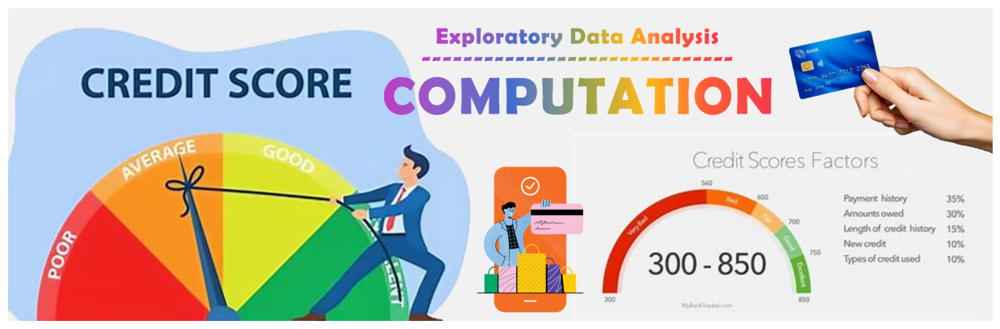

## 🧐<font color="gold">Problem statement</font>

* To conduct a thorough exploratory data analysis (EDA) and deep analysis of a comprehensive dataset containing basic customer details and extensive credit-related information. The aim is to create new, informative features, calculate a hypothetical credit score, and uncover meaningful patterns, anomalies, and insights within the data.

* This casestudy expects a deep dive into bank details and credit data, creating valuable features, a hypothetical credit score, and uncovering hidden patterns. This involves thorough EDA, strategic feature engineering, model-driven score calculation, and insightful analysis that reveals factors influencing creditworthiness and guides potential risk mitigation strategies.

* Remember, your analysis isn't just about dissecting data but uncovering actionable insights. Create a credit score strategy that you think would be the best and mention your justifications for criteria, weightage for the features

  
  
> Data Dictionary:


| Column Name               | Description                                                      |
|---------------------------|------------------------------------------------------------------|
| ID                        | Represents a unique identification of an entry                   |
| Customer_ID               | Represents a unique identification of a person                   |
| Month                     | Represents the month of the year                                 |
| Name                      | Represents the name of a person                                  |
| Age                       | Represents the age of the person                                 |
| SSN                       | Represents the social security number of a person                |
| Occupation                | Represents the occupation of the person                          |
| Annual_Income             | Represents the annual income of the person                       |
| Monthly_Inhand_Salary     | Represents the monthly base salary of a person                   |
| Num_Bank_Accounts         | Represents the number of bank accounts a person holds            |
| Num_Credit_Card           | Represents the number of other credit cards held by a person     |
| Interest_Rate             | Represents the interest rate on credit card                      |
| Num_of_Loan               | Represents the number of loans taken from the bank               |
| Type_of_Loan              | Represents the types of loan taken by a person                   |
| Delay_from_due_date       | Represents the average number of days delayed from the payment date |
| Num_of_Delayed_Payment    | Represents the average number of payments delayed by a person    |
| Changed_Credit_Limit      | Represents the percentage change in credit card limit            |
| Num_Credit_Inquiries      | Represents the number of credit card inquiries                   |
| Credit_Mix                | Represents the classification of the mix of credits              |
| Outstanding_Debt          | Represents the remaining debt to be paid (in USD)                |
| Credit_Utilization_Ratio  | Represents the utilization ratio of credit card                  |
| Credit_History_Age        | Represents the age of credit history of the person               |
| Payment_of_Min_Amount     | Represents whether only the minimum amount was paid by the person |
| Total_EMI_per_month       | Represents the monthly EMI payments (in USD)                     |
| Amount_invested_monthly   | Represents the monthly amount invested by the customer (in USD)  |
| Payment_Behaviour         | Represents the payment behavior of the customer (in USD)         |
| Monthly_Balance           | Represents the monthly balance amount of the customer (in USD)   |


### ✍🏼Methodology

> Exploratory Data Analysis (EDA):

* Performing a comprehensive EDA to understand the data's structure, characteristics, distributions, and relationships.
* Identified and addressed any missing values, mismatch data types, inconsistencies, or outliers.
* Utilized appropriate visualizations (e.g., histograms, scatter plots, box plots, correlation matrices) to uncover patterns and insights.

> Feature Engineering:

* Created new features that can be leveraged for the calculation of credit scores based on domain knowledge and insights from EDA 
    
> Hypothetical Credit Score Calculation:

* Developed a methodology to calculate a hypothetical credit score(kinda CIBIL/FICO ranges from 300-850,900) using relevant features (using a minimum of 5 maximum of 10 features) and justified it.

* Explored various weighting schemes to assign scores.
* Provided a score for each individual customer

> References

* https://thedocs.worldbank.org/en/doc/935891585869698451-0130022020/original/CREDITSCORINGAPPROACHESGUIDELINESFINALWEB.pdf
* https://www.iifl.com/blogs/cibil-score/different-types-of-credit-score
* https://www.etmoney.com/learn/loans/difference-between-cibil-score-and-credit-score/


> Also thought about:

* Can credit score and aggregated features be calculated at different time frames like the last 3 months/last 6 months (recency based metrics)

> Analysis and Insights

* Added valuable insights from EDA and credit score calculation



### 📚Importing Libraries and Modules

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import re
from sklearn.preprocessing import MinMaxScaler

import warnings
warnings.filterwarnings('ignore')

## 🥸Data Wrangling

In [2]:
pd.set_option('display.max_columns',50)
pd.set_option('display.max_rows', 50)

In [3]:
data = pd.read_csv('Credit_score.csv')
data.head(8)

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3,7,11.27,4.0,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529544,High_spent_Small_value_payments,312.4940887
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",-1,NaN,11.27,4.0,Good,809.98,31.944960,NaN,No,49.574949,118.2802216,Low_spent_Large_value_payments,284.6291625
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3,7,_,4.0,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.69952126,Low_spent_Medium_value_payments,331.2098629
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",5,4,6.27,4.0,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580744,Low_spent_Small_value_payments,223.4513097
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",6,NaN,11.27,4.0,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.42015309,High_spent_Medium_value_payments,341.489231
5,0x1607,CUS_0xd40,June,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",8,4,9.27,4.0,Good,809.98,27.262259,22 Years and 6 Months,No,49.574949,62.43017233,!@9#%8,340.4792118
6,0x1608,CUS_0xd40,July,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3,8_,11.27,4.0,Good,809.98,22.537593,22 Years and 7 Months,No,49.574949,178.3440674,Low_spent_Small_value_payments,244.5653167
7,0x1609,CUS_0xd40,August,NaN,23,#F%$D@*&8,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3,6,11.27,4.0,Good,809.98,23.933795,NaN,No,49.574949,24.78521651,High_spent_Medium_value_payments,358.1241676


In [4]:
df = data.copy()

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 27 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  object 
 1   Customer_ID               100000 non-null  object 
 2   Month                     100000 non-null  object 
 3   Name                      90015 non-null   object 
 4   Age                       100000 non-null  object 
 5   SSN                       100000 non-null  object 
 6   Occupation                100000 non-null  object 
 7   Annual_Income             100000 non-null  object 
 8   Monthly_Inhand_Salary     84998 non-null   float64
 9   Num_Bank_Accounts         100000 non-null  int64  
 10  Num_Credit_Card           100000 non-null  int64  
 11  Interest_Rate             100000 non-null  int64  
 12  Num_of_Loan               100000 non-null  object 
 13  Type_of_Loan              88592 non-null   ob

In [6]:
df[df.duplicated()]

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance


##### 🕵🏼‍♂️Insights

- This data has no duplicates.

### 🧹Column wise Cleaning

In [7]:
categorical_columns = df.select_dtypes(include=['object', 'category']).columns
numerical_columns = df.select_dtypes(include=['number']).columns


In [8]:
categorical_columns

Index(['ID', 'Customer_ID', 'Month', 'Name', 'Age', 'SSN', 'Occupation',
       'Annual_Income', 'Num_of_Loan', 'Type_of_Loan',
       'Num_of_Delayed_Payment', 'Changed_Credit_Limit', 'Credit_Mix',
       'Outstanding_Debt', 'Credit_History_Age', 'Payment_of_Min_Amount',
       'Amount_invested_monthly', 'Payment_Behaviour', 'Monthly_Balance'],
      dtype='object')

In [9]:
numerical_columns

Index(['Monthly_Inhand_Salary', 'Num_Bank_Accounts', 'Num_Credit_Card',
       'Interest_Rate', 'Delay_from_due_date', 'Num_Credit_Inquiries',
       'Credit_Utilization_Ratio', 'Total_EMI_per_month'],
      dtype='object')

In [10]:
df.sample()

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance
73649,0x1c58b,CUS_0xb742,February,Martellc,18,630-69-4858,Media_Manager,40846.36,3614.863333,3,2,7,1,Student Loan,3,7,6.53,1.0,Good,1262.52,39.750793,18 Years and 11 Months,No,28.162839,NaN,Low_spent_Small_value_payments,427.8342047


### 🔸❓**Null Detection**

In [11]:
df.isna().sum()

ID                              0
Customer_ID                     0
Month                           0
Name                         9985
Age                             0
SSN                             0
Occupation                      0
Annual_Income                   0
Monthly_Inhand_Salary       15002
Num_Bank_Accounts               0
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                     0
Type_of_Loan                11408
Delay_from_due_date             0
Num_of_Delayed_Payment       7002
Changed_Credit_Limit            0
Num_Credit_Inquiries         1965
Credit_Mix                      0
Outstanding_Debt                0
Credit_Utilization_Ratio        0
Credit_History_Age           9030
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly      4479
Payment_Behaviour               0
Monthly_Balance              1200
dtype: int64

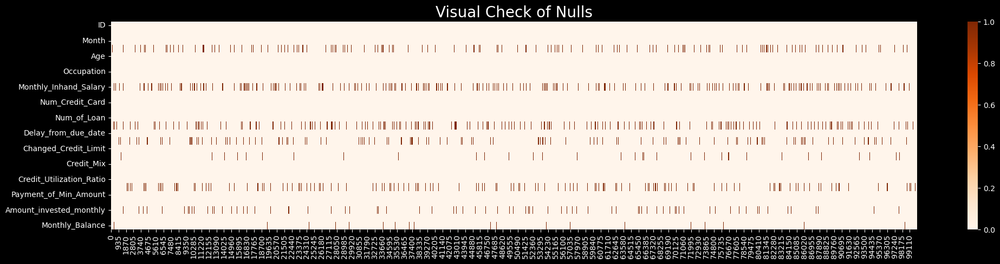

In [14]:
plt.figure(figsize=(24,5))
plt.style.use('dark_background')
sns.heatmap(df.isnull().T,cmap='Oranges')
plt.title('Visual Check of Nulls',fontsize=20)
plt.show()

In [ ]:
"""# wiping out irrevelant data

#tried not working... look into it
'''def replace_with_null(df):
    # regex pattern to match underscores or hyphens
    pattern = r'[_-]'
    df.replace(to_replace=pattern, value=np.nan, regex=True, inplace=True)
    return df'''

def replace_with_null(value):
    pattern = r'[!@9#%8|#F%$D@*&8|NA]'

    if isinstance(value, str) and re.search(pattern, value):
        return None
    return value

df = df.applymap(replace_with_null)
df.head(8)"""

# Creating a lot of ruckus.. lets try column wise 

"# wiping out irrevelant data\n\n#tried not working... look into it\n'''def replace_with_null(df):\n    # regex pattern to match underscores or hyphens\n    pattern = r'[_-]'\n    df.replace(to_replace=pattern, value=np.nan, regex=True, inplace=True)\n    return df'''\n\ndef replace_with_null(value):\n    pattern = r'[!@9#%8|#F%$D@*&8|NA]'\n\n    if isinstance(value, str) and re.search(pattern, value):\n        return None\n    return value\n\ndf = df.applymap(replace_with_null)\ndf.head(8)"

##### 🕵🏼‍♂️Perfect columns
* The features `ID`, `Customer_ID`, and `Month` exhibited no redundancy in the dataset.

#### 1️⃣ Name

In [ ]:
df.Name.dtype

dtype('O')

In [ ]:
df.Name.nunique()

10139

In [ ]:
df['Name'] = df.groupby('Customer_ID')['Name'].ffill()
df['Name'] = df.groupby('Customer_ID')['Name'].bfill()

In [ ]:
df.Name.isna().sum()

np.int64(0)

In [ ]:
df.Name.unique()

array(['Aaron Maashoh', 'Rick Rothackerj', 'Langep', ...,
       'Chris Wickhamm', 'Sarah McBridec', 'Nicks'], dtype=object)

In [ ]:
df.Name.nunique()

10139

##### 🕵🏼‍♂️Insights

- The `Name` column contained some null values, which have now been filled.

#### 2️⃣ Age

> After cleaning feature name is 'age'

In [ ]:
df.Age.nunique()

1788

In [ ]:
df.Age.unique()

array(['23', '-500', '28_', ..., '4808_', '2263', '1342'], dtype=object)

In [ ]:
df.Age.isna().sum()

np.int64(0)

In [ ]:
def clean_age(value):
    # Replace '-' and non-numeric characters with NaN
    if isinstance(value, str) and not re.match(r'^\d+$', value):
        return np.nan
    return value

# Apply cleaning to the 'Age' column
df['Age'] = df['Age'].apply(clean_age)
# Convert 'Age' column to numeric, coercing errors to NaN
df['Age'] = pd.to_numeric(df['Age'], errors='coerce')

# Fill missing values with mode for each 'Name'
#df['Age'] = df.groupby('Name')['Age'].transform(lambda x: x.fillna(x.mode()[0] if not x.mode().empty else np.nan))

In [ ]:
df.Age.unique() ,  df.Age.dtype

(array([  23.,   nan,   28., ..., 6476., 2263., 1342.]), dtype('float64'))

In [ ]:
def fill_mode(series):
    mode_value = series.mode()
    if not mode_value.empty:   ## if mode_value is not none: also works
        return mode_value[0] 
    # chances of bimodal values here we consider the first value since year of happening is not mentioned.
    else:
        return np.nan

In [ ]:
df['age'] = df.groupby('Customer_ID')['Age'].transform(fill_mode)

In [ ]:
df.age.nunique() , df.age.unique() , df.age.dtype

(43,
 array([23., 28., 34., 55., 21., 31., 30., 44., 40., 33., 35., 39., 37.,
        20., 46., 26., 41., 32., 48., 43., 22., 36., 16., 18., 42., 19.,
        15., 27., 38., 14., 25., 45., 47., 17., 53., 24., 54., 29., 49.,
        51., 50., 52., 56.]),
 dtype('float64'))

In [ ]:
df['age'] = df['age'].astype(int)

In [ ]:
df.age.min() , df.age.max()

(np.int64(14), np.int64(56))

In [ ]:
df['age'] = df['age'].astype(int)

In [ ]:
df.groupby(['Customer_ID','Name'])['Age'].unique()

Customer_ID  Name          
CUS_0x1000   Alistair Barrf    [17.0, nan, 18.0]
CUS_0x1009   Arunah                 [25.0, 26.0]
CUS_0x100b   Shirboni               [18.0, 19.0]
CUS_0x1011   Schneyerh               [nan, 44.0]
CUS_0x1013   Cameront          [43.0, 44.0, nan]
                                     ...        
CUS_0xff3    Somervilled                  [55.0]
CUS_0xff4    Poornimaf         [36.0, nan, 37.0]
CUS_0xff6    Shieldsb               [18.0, 19.0]
CUS_0xffc    Brads                  [17.0, 18.0]
CUS_0xffd    Damouniq          [29.0, nan, 30.0]
Name: Age, Length: 12500, dtype: object

In [ ]:
df.groupby(['Customer_ID','Name'])['age'].unique()

Customer_ID  Name          
CUS_0x1000   Alistair Barrf    [17]
CUS_0x1009   Arunah            [26]
CUS_0x100b   Shirboni          [18]
CUS_0x1011   Schneyerh         [44]
CUS_0x1013   Cameront          [44]
                               ... 
CUS_0xff3    Somervilled       [55]
CUS_0xff4    Poornimaf         [37]
CUS_0xff6    Shieldsb          [19]
CUS_0xffc    Brads             [17]
CUS_0xffd    Damouniq          [29]
Name: age, Length: 12500, dtype: object

In [ ]:
df.age.isna().sum()

np.int64(0)

In [ ]:
df.drop(columns=['Age'],inplace=True)

##### 🕵🏼‍♂️Insights
* The `Age` feature contained many null and irrelevant values that were affecting the data type. These were addressed by filling in missing values with the most frequent mode. In cases where the mode was bimodal, the first mode value was used.
* The treated feature is `age` and original messed feature has been dropped.

#### 3️⃣ Social-Security-Number

In [ ]:
df.sample()

,ID,Customer_ID,Month,Name,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,age
87843,0x218b5,CUS_0x14f1,April,Viswanathag,058-16-7275,Engineer,40701.88,NaN,8,9,26,3,"Not Specified, Home Equity Loan, and Home Equi...",29,17,11.86,12.0,Standard,2052.1,35.394634,6 Years and 2 Months,Yes,72.238579,187.6253902,High_spent_Small_value_payments,331.1183647,30


In [ ]:
df.SSN.dtype

dtype('O')

In [ ]:
df.SSN.nunique()

12501

In [ ]:
df[df.SSN=='#F%$D@*&8']['SSN'].count()

np.int64(5572)

In [ ]:
df['SSN'] = df['SSN'].replace(['#F%$D@*&8'], np.nan)

In [ ]:
df['SSN'].isna().sum()

np.int64(5572)

In [ ]:
df['SSN'] = df.groupby('Customer_ID')['SSN'].ffill()
df['SSN'] = df.groupby('Customer_ID')['SSN'].bfill()

In [ ]:
df['SSN'].isna().sum()

np.int64(0)

In [ ]:
df[df['Name']=='Clara Ferreira-Marquesi']

,ID,Customer_ID,Month,Name,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,age
1008,0x1bea,CUS_0x3fbf,January,Clara Ferreira-Marquesi,646-12-1414,Accountant,27796.42_,2300.368333,6,5,16,2,"Home Equity Loan, and Student Loan",18,14,11.85,7.0,Standard,1073.94,41.027325,27 Years and 1 Months,Yes,36.067631,128.2161902,High_spent_Small_value_payments,325.7530119,15
1009,0x1beb,CUS_0x3fbf,February,Clara Ferreira-Marquesi,646-12-1414,Accountant,27796.42,2300.368333,6,5,16,-100,"Home Equity Loan, and Student Loan",18,14,11.85,7.0,Standard,1073.94,30.389655,27 Years and 2 Months,Yes,36.067631,130.0996114,Low_spent_Large_value_payments,333.8695906,15
1010,0x1bec,CUS_0x3fbf,March,Clara Ferreira-Marquesi,646-12-1414,Accountant,27796.42,2300.368333,6,5,16,2,"Home Equity Loan, and Student Loan",20,13,11.85,7.0,_,1073.94,37.156219,27 Years and 3 Months,Yes,36.067631,75.71790454,High_spent_Medium_value_payments,368.2512975,15
1011,0x1bed,CUS_0x3fbf,April,Clara Ferreira-Marquesi,646-12-1414,_______,27796.42,2300.368333,6,5,16,2,"Home Equity Loan, and Student Loan",18,16,_,7.0,Standard,1073.94,24.057561,27 Years and 4 Months,Yes,36.067631,84.99894038,High_spent_Medium_value_payments,358.9702617,15
1012,0x1bee,CUS_0x3fbf,May,Clara Ferreira-Marquesi,646-12-1414,Accountant,27796.42,2300.368333,6,5,16,2,"Home Equity Loan, and Student Loan",18,11,11.85,10.0,_,1073.94,40.350447,27 Years and 5 Months,Yes,36.067631,200.6710898,Low_spent_Large_value_payments,263.2981122,15
1013,0x1bef,CUS_0x3fbf,June,Clara Ferreira-Marquesi,646-12-1414,Accountant,27796.42,2300.368333,6,5,16,2,"Home Equity Loan, and Student Loan",20,14,11.85,10.0,Standard,1073.94,22.205761,NaN,Yes,36.067631,302.0617222,Low_spent_Small_value_payments,181.9074799,15
1014,0x1bf0,CUS_0x3fbf,July,Clara Ferreira-Marquesi,646-12-1414,Accountant,27796.42,2300.368333,6,5,16,2,"Home Equity Loan, and Student Loan",18,15,11.85,10.0,Standard,1073.94,27.452330,27 Years and 7 Months,Yes,36.067631,34.56742202,High_spent_Large_value_payments,399.40178,15
1015,0x1bf1,CUS_0x3fbf,August,Clara Ferreira-Marquesi,646-12-1414,Accountant,27796.42,2300.368333,6,5,16,2,"Home Equity Loan, and Student Loan",18,11,10.85,10.0,Standard,1073.94,33.988442,27 Years and 8 Months,NM,36.067631,56.36788663,!@9#%8,387.6013154,15


In [ ]:
# could have also used this method.
"""# Function to compute mode and fill NaN
def fill_mode(series):
    mode_value = series.mode()
    if not mode_value.empty:
        return series.fillna(mode_value[0])
    else:
        return series

# Apply the function to each group
df['SSN'] = df.groupby('Customer_ID')['SSN'].transform(fill_mode)"""

"# Function to compute mode and fill NaN\ndef fill_mode(series):\n    mode_value = series.mode()\n    if not mode_value.empty:\n        return series.fillna(mode_value[0])\n    else:\n        return series\n\n# Apply the function to each group\ndf['SSN'] = df.groupby('Customer_ID')['SSN'].transform(fill_mode)"

##### 🕵🏼‍♂️ Insights
- The `SSN` (social security Number) column had some Irrevalant data and it has been treated.



#### 4️⃣ Occupation

In [ ]:
df.Occupation.dtype , df.Occupation.nunique()

(dtype('O'), 16)

In [ ]:
df.Occupation.unique()

array(['Scientist', '_______', 'Teacher', 'Engineer', 'Entrepreneur',
       'Developer', 'Lawyer', 'Media_Manager', 'Doctor', 'Journalist',
       'Manager', 'Accountant', 'Musician', 'Mechanic', 'Writer',
       'Architect'], dtype=object)

In [ ]:
df[df.Occupation=='_______']['ID'].count()

np.int64(7062)

In [ ]:
df['Occupation'] = df['Occupation'].replace(['_______'], np.nan)

In [ ]:
df['Occupation'] = df.groupby('Customer_ID')['Occupation'].ffill()
df['Occupation'] = df.groupby('Customer_ID')['Occupation'].bfill()

In [ ]:
df.Occupation.isna().sum()

np.int64(0)

In [ ]:
df.Occupation.nunique() , df.Occupation.unique() 

(15,
 array(['Scientist', 'Teacher', 'Engineer', 'Entrepreneur', 'Developer',
        'Lawyer', 'Media_Manager', 'Doctor', 'Journalist', 'Manager',
        'Accountant', 'Musician', 'Mechanic', 'Writer', 'Architect'],
       dtype=object))

##### 🕵🏼‍♂️Insights

* The `Occupation` had some irrelavant data and it removed and replaced with relavant values.

#### 5️⃣ Annual_Income

In [ ]:
df.sample()

,ID,Customer_ID,Month,Name,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,age
98406,0x25698,CUS_0xac4a,July,Alexw,514-32-8216,Mechanic,25883.65,2324.970833,4,6,6,5,"Personal Loan, Credit-Builder Loan, Student Lo...",16,NaN,17.33,11.0,Standard,47.03,32.713293,NaN,Yes,82.188788,72.43078979,High_spent_Medium_value_payments,327.877506,29


In [ ]:
df.Annual_Income.dtype

dtype('O')

In [ ]:
# Replace underscores with NaN in the Annual_Income column
df['Annual_Income'] = df['Annual_Income'].replace(r'_', np.nan, regex=True)

# Convert the column to numeric, coercing errors to NaN
df['Annual_Income'] = pd.to_numeric(df['Annual_Income'], errors='coerce')

In [ ]:
df['Annual_Income'] = df.groupby('Customer_ID')['Annual_Income'].ffill()
df['Annual_Income'] = df.groupby('Customer_ID')['Annual_Income'].bfill()

In [ ]:
df.Annual_Income.dtype

dtype('float64')

In [ ]:
df.Annual_Income.nunique() , df.Annual_Income.unique()

(13437,
 array([ 19114.12,  34847.84, 143162.64, ...,  37188.1 ,  20002.88,
         39628.99]))

In [ ]:
df[df['Customer_ID']=='CUS_0x4c96']

,ID,Customer_ID,Month,Name,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,age
45744,0x1220a,CUS_0x4c96,January,Ann Saphirw,961-65-0909,Teacher,99868.83,8332.4025,2,3,2,3,"Auto Loan, Credit-Builder Loan, and Auto Loan",5,9,9.11,1.0,Good,693.76,30.253597,21 Years and 11 Months,No,146.701253,838.6232195,Low_spent_Small_value_payments,137.9157779,53
45745,0x1220b,CUS_0x4c96,February,Ann Saphirw,961-65-0909,Teacher,99868.83,8332.4025,2,3,2,-100,"Auto Loan, Credit-Builder Loan, and Auto Loan",5,11,9.11,1.0,Good,693.76,37.825423,22 Years and 0 Months,No,146.701253,504.2438081,High_spent_Small_value_payments,442.2951894,53
45746,0x1220c,CUS_0x4c96,March,Ann Saphirw,961-65-0909,Teacher,99868.83,8332.4025,2,3,2,3,"Auto Loan, Credit-Builder Loan, and Auto Loan",5,NaN,12.11,1.0,Good,693.76,30.464581,22 Years and 1 Months,No,146.701253,344.420975,High_spent_Medium_value_payments,592.1180225,53
45747,0x1220d,CUS_0x4c96,April,Ann Saphirw,961-65-0909,Teacher,99868.83,8332.4025,2,3,2,3,"Auto Loan, Credit-Builder Loan, and Auto Loan",5,11,9.11,1.0,Good,693.76,36.599111,22 Years and 2 Months,No,146.701253,228.959539,High_spent_Medium_value_payments,707.5794585,53
45748,0x1220e,CUS_0x4c96,May,Ann Saphirw,961-65-0909,Teacher,99868.83,8332.4025,2,3,2,3,"Auto Loan, Credit-Builder Loan, and Auto Loan",5,NaN,16.11,1.0,Good,693.76,32.590720,22 Years and 3 Months,No,146.701253,687.7160324,Low_spent_Medium_value_payments,278.8229651,53
45749,0x1220f,CUS_0x4c96,June,Ann Saphirw,961-65-0909,Teacher,99868.83,8332.4025,2,3,2,3_,"Auto Loan, Credit-Builder Loan, and Auto Loan",5,11,9.11,1.0,_,693.76,34.129657,22 Years and 4 Months,NM,146.701253,129.6016348,High_spent_Large_value_payments,796.9373627,53
45750,0x12210,CUS_0x4c96,July,Ann Saphirw,961-65-0909,Teacher,99868.83,8332.4025,2,3,2,3,"Auto Loan, Credit-Builder Loan, and Auto Loan",5,11,9.11,1.0,_,693.76,33.395212,22 Years and 5 Months,No,146.701253,NaN,Low_spent_Medium_value_payments,370.5132427,53
45751,0x12211,CUS_0x4c96,August,Ann Saphirw,961-65-0909,Teacher,99868.83,8332.4025,2,3,2,3,"Auto Loan, Credit-Builder Loan, and Auto Loan",5,11,9.11,1.0,Good,693.76,33.785169,22 Years and 6 Months,No,146.701253,310.9168806,High_spent_Medium_value_payments,625.6221168,53


##### 🕵🏼‍♂️Insights
* The `Annual_Income` feature, initially in object datatype with some irrelevant data, has been cleaned and converted to the appropriate numeric format.

#### 6️⃣ Monthly_Inhand_Salary 

In [ ]:
df['Monthly_Inhand_Salary'].dtype

dtype('float64')

In [ ]:
df['Monthly_Inhand_Salary'].isna().sum()

np.int64(15002)

In [ ]:
df['Monthly_Inhand_Salary'] = df.groupby('Customer_ID')['Monthly_Inhand_Salary'].ffill()
df['Monthly_Inhand_Salary'] = df.groupby('Customer_ID')['Monthly_Inhand_Salary'].bfill()

In [ ]:
df['Monthly_Inhand_Salary'].isna().sum()

np.int64(0)

In [ ]:
df.head(8)

,ID,Customer_ID,Month,Name,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,age
0,0x1602,CUS_0xd40,January,Aaron Maashoh,821-00-0265,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3,7,11.27,4.0,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529544,High_spent_Small_value_payments,312.4940887,23
1,0x1603,CUS_0xd40,February,Aaron Maashoh,821-00-0265,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",-1,NaN,11.27,4.0,Good,809.98,31.944960,NaN,No,49.574949,118.2802216,Low_spent_Large_value_payments,284.6291625,23
2,0x1604,CUS_0xd40,March,Aaron Maashoh,821-00-0265,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3,7,_,4.0,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.69952126,Low_spent_Medium_value_payments,331.2098629,23
3,0x1605,CUS_0xd40,April,Aaron Maashoh,821-00-0265,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",5,4,6.27,4.0,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580744,Low_spent_Small_value_payments,223.4513097,23
4,0x1606,CUS_0xd40,May,Aaron Maashoh,821-00-0265,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",6,NaN,11.27,4.0,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.42015309,High_spent_Medium_value_payments,341.489231,23
5,0x1607,CUS_0xd40,June,Aaron Maashoh,821-00-0265,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",8,4,9.27,4.0,Good,809.98,27.262259,22 Years and 6 Months,No,49.574949,62.43017233,!@9#%8,340.4792118,23
6,0x1608,CUS_0xd40,July,Aaron Maashoh,821-00-0265,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3,8_,11.27,4.0,Good,809.98,22.537593,22 Years and 7 Months,No,49.574949,178.3440674,Low_spent_Small_value_payments,244.5653167,23
7,0x1609,CUS_0xd40,August,Aaron Maashoh,821-00-0265,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3,6,11.27,4.0,Good,809.98,23.933795,NaN,No,49.574949,24.78521651,High_spent_Medium_value_payments,358.1241676,23


##### 🕵🏼‍♂️Insights

* The feature `Monthly_Inhand_Salary` had some null values and it has been filled with the appropriate values.

#### 7️⃣ Num_Bank_Accounts

In [ ]:
df.Num_Bank_Accounts.dtype

dtype('int64')

In [ ]:
df.Num_Bank_Accounts.isna().sum()

np.int64(0)

In [ ]:
df.Num_Bank_Accounts.nunique()

943

In [ ]:
df['Num_Bank_Accounts'] = df['Num_Bank_Accounts'].replace(-1,0)

In [ ]:
df['Num_Bank_Acc'] = df.groupby('Customer_ID')['Num_Bank_Accounts'].transform(fill_mode)

In [ ]:
df[df['Name']=='Thomass'][['SSN','Name','Month','Num_Bank_Accounts','Num_Bank_Acc']]

,SSN,Name,Month,Num_Bank_Accounts,Num_Bank_Acc
9488,739-35-4103,Thomass,January,5,5
9489,739-35-4103,Thomass,February,5,5
9490,739-35-4103,Thomass,March,5,5
9491,739-35-4103,Thomass,April,5,5
9492,739-35-4103,Thomass,May,5,5
9493,739-35-4103,Thomass,June,5,5
9494,739-35-4103,Thomass,July,5,5
9495,739-35-4103,Thomass,August,5,5
56728,733-72-3818,Thomass,January,6,6
56729,733-72-3818,Thomass,February,6,6


In [ ]:
df['Num_Bank_Acc'].min() , df['Num_Bank_Acc'].max()

(np.int64(0), np.int64(10))

In [ ]:
df.drop(columns=['Num_Bank_Accounts'],inplace=True)

##### 🕵🏼‍♂️Insight
* The feature  `Num_Bank_Accounts` had many irrelavant data and those have been filled with appropriate values.
* The New feature named `Num_Bank_Acc` was created 

#### 8️⃣ Num_Credit_Card

In [ ]:
df.sample()

,ID,Customer_ID,Month,Name,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,age,Num_Bank_Acc
53332,0x14e7e,CUS_0x12cb,May,Sakarif,075-60-6485,Writer,45188.52,3868.71,10,22,7,"Home Equity Loan, Student Loan, Home Equity Lo...",42,22,10.45,11.0,Standard,1960.28,34.687887,15 Years and 2 Months,Yes,154.357458,128.7008689,High_spent_Medium_value_payments,353.8126727,39,9


In [ ]:
df['Num_Credit_Card'].dtype

dtype('int64')

In [ ]:
df['Num_Credit_Card'].isna().sum()

np.int64(0)

In [ ]:
df['Num_Credit_Card'].nunique() , df['Num_Credit_Card'].unique()

(1179, array([   4, 1385,    5, ...,  955, 1430,  679]))

In [ ]:
df['No_of_Credit_Card'] = df.groupby('Customer_ID')['Num_Credit_Card'].transform(fill_mode)

In [ ]:
df[df.Name=='Dolano']

,ID,Customer_ID,Month,Name,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,age,Num_Bank_Acc,No_of_Credit_Card
66464,0x19b72,CUS_0x7666,January,Dolano,922-59-5950,Entrepreneur,113284.84,9516.403333,4,7,3,"Debt Consolidation Loan, Home Equity Loan, and...",5,16,18.59,1.0,Standard,920.25,27.305788,16 Years and 4 Months,Yes,257.616616,360.6056908,High_spent_Medium_value_payments,583.4180265,54,5,4
66465,0x19b73,CUS_0x7666,February,Dolano,922-59-5950,Entrepreneur,113284.84,9516.403333,4,7,3,"Debt Consolidation Loan, Home Equity Loan, and...",5,18,18.59,1.0,Standard,920.25,37.319840,16 Years and 5 Months,Yes,257.616616,859.4255634,Low_spent_Large_value_payments,104.5981539,54,5,4
66466,0x19b74,CUS_0x7666,March,Dolano,922-59-5950,Entrepreneur,113284.84,9516.403333,18,7,3,"Debt Consolidation Loan, Home Equity Loan, and...",5,16,18.59,1.0,Standard,920.25,35.071993,16 Years and 6 Months,Yes,257.616616,118.1491899,High_spent_Large_value_payments,815.8745275,54,5,4
66467,0x19b75,CUS_0x7666,April,Dolano,922-59-5950,Entrepreneur,113284.84,9516.403333,4,7,3,"Debt Consolidation Loan, Home Equity Loan, and...",5,16,18.59,1.0,Standard,920.25,35.936157,16 Years and 7 Months,Yes,257.616616,334.2680024,High_spent_Medium_value_payments,609.7557149,54,5,4
66468,0x19b76,CUS_0x7666,May,Dolano,922-59-5950,Entrepreneur,113284.84,9516.403333,1089,7,3,"Debt Consolidation Loan, Home Equity Loan, and...",5,15,18.59,2.0,Standard,920.25,27.292384,16 Years and 8 Months,Yes,257.616616,404.0133005,Low_spent_Medium_value_payments,570.0104168,54,5,4
66469,0x19b77,CUS_0x7666,June,Dolano,922-59-5950,Entrepreneur,113284.84,9516.403333,141,7,3,"Debt Consolidation Loan, Home Equity Loan, and...",5,13,18.59,2.0,Standard,920.25,33.103244,16 Years and 9 Months,Yes,257.616616,__10000__,High_spent_Large_value_payments,794.4460248,54,5,4
66470,0x19b78,CUS_0x7666,July,Dolano,922-59-5950,Entrepreneur,113284.84,9516.403333,4,7,3,"Debt Consolidation Loan, Home Equity Loan, and...",5,NaN,17.59,2.0,Standard,920.25,36.908393,16 Years and 10 Months,Yes,257.616616,484.4120929,High_spent_Small_value_payments,469.6116244,54,5,4
66471,0x19b79,CUS_0x7666,August,Dolano,922-59-5950,Entrepreneur,113284.84,9516.403333,4,7,3,"Debt Consolidation Loan, Home Equity Loan, and...",5,16,18.59,2.0,Standard,920.25,28.216688,16 Years and 11 Months,Yes,257.616616,511.2635653,Low_spent_Large_value_payments,452.760152,54,5,4


In [ ]:
df.drop(columns=['Num_Credit_Card'],inplace=True)

In [ ]:
df.No_of_Credit_Card.dtype , df.No_of_Credit_Card.nunique() , df.No_of_Credit_Card.unique()

(dtype('int64'), 12, array([ 4,  5,  1,  7,  6,  8,  3,  9,  2, 10, 11,  0]))

In [ ]:
df.No_of_Credit_Card.min() , df.No_of_Credit_Card.max()

(np.int64(0), np.int64(11))

In [ ]:
df.sample()

,ID,Customer_ID,Month,Name,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,age,Num_Bank_Acc,No_of_Credit_Card
20882,0x905c,CUS_0xa73b,March,Niveditak,341-87-3689,Scientist,26526.93,2199.5775,13,4,"Student Loan, Not Specified, Home Equity Loan,...",5,8,5.3,1.0,Standard,896.49,40.537601,30 Years and 1 Months,Yes,76.556029,32.56952904,High_spent_Medium_value_payments,360.8321923,41,4,7


##### 🕵🏼‍♂️Insights
* The feature `Num_Credit_Card` had many irrelavant data and it has been filled with appropriate values.
* New feature `No_of_Credit_Card` has created with perfect values.

#### 9️⃣ Interest_Rate

In [ ]:
df.Interest_Rate.dtype , df.Interest_Rate.nunique() , df.Interest_Rate.unique()  

(dtype('int64'), 1750, array([   3,    6,    8, ..., 1347,  387, 5729]))

In [ ]:
df.Interest_Rate.isna().sum()

np.int64(0)

In [ ]:
df['interest_rate'] = df.groupby('Customer_ID')['Interest_Rate'].transform(fill_mode)

In [ ]:
df[df.Name=='Anna Yukhananovd']

,ID,Customer_ID,Month,Name,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,age,Num_Bank_Acc,No_of_Credit_Card,interest_rate
23512,0x9fc6,CUS_0x2fab,January,Anna Yukhananovd,411-00-6543,Manager,75804.94,6120.078333,5788,3,"Credit-Builder Loan, Home Equity Loan, and Mor...",9,8,7.89,2.0,Good,330.82,35.641926,31 Years and 9 Months,No,141.289448,51.86724209,High_spent_Large_value_payments,658.8511428,27,0,1,10
23513,0x9fc7,CUS_0x2fab,February,Anna Yukhananovd,411-00-6543,Manager,75804.94,6120.078333,10,3,"Credit-Builder Loan, Home Equity Loan, and Mor...",9,7,7.89,2.0,Good,330.82,35.324892,31 Years and 10 Months,No,141.289448,__10000__,High_spent_Medium_value_payments,587.762726,27,0,1,10
23514,0x9fc8,CUS_0x2fab,March,Anna Yukhananovd,411-00-6543,Manager,75804.94,6120.078333,10,-100,"Credit-Builder Loan, Home Equity Loan, and Mor...",9,7,13.89,2.0,_,330.82,29.152049,31 Years and 11 Months,No,141.289448,49.61176603,High_spent_Large_value_payments,661.1066188,27,0,1,10
23515,0x9fc9,CUS_0x2fab,April,Anna Yukhananovd,411-00-6543,Manager,75804.94,6120.078333,10,3,"Credit-Builder Loan, Home Equity Loan, and Mor...",9,4,7.89,2.0,Good,330.82,41.050072,32 Years and 0 Months,No,141.289448,81.14376064,High_spent_Medium_value_payments,639.5746242,27,0,1,10
23516,0x9fca,CUS_0x2fab,May,Anna Yukhananovd,411-00-6543,Manager,75804.94,6120.078333,10,3_,"Credit-Builder Loan, Home Equity Loan, and Mor...",9,7,7.89,2.0,Good,330.82,39.176332,32 Years and 1 Months,No,141.289448,485.8331017,Low_spent_Medium_value_payments,264.8852832,27,0,1,10
23517,0x9fcb,CUS_0x2fab,June,Anna Yukhananovd,411-00-6543,Manager,75804.94,6120.078333,10,3,"Credit-Builder Loan, Home Equity Loan, and Mor...",9,7,7.89,2.0,Good,330.82,28.003736,32 Years and 2 Months,NM,141.289448,161.5290727,Low_spent_Medium_value_payments,589.1893121,27,0,1,10
23518,0x9fcc,CUS_0x2fab,July,Anna Yukhananovd,411-00-6543,Manager,75804.94,6120.078333,10,3,"Credit-Builder Loan, Home Equity Loan, and Mor...",14,7,7.89,2.0,Good,330.82,37.019835,32 Years and 3 Months,NM,141.289448,104.3770881,High_spent_Medium_value_payments,616.3412967,27,0,1,10
23519,0x9fcd,CUS_0x2fab,August,Anna Yukhananovd,411-00-6543,Manager,75804.94,6120.078333,10,3_,"Credit-Builder Loan, Home Equity Loan, and Mor...",11,7,7.89,5.0,Good,330.82,24.348473,32 Years and 4 Months,NM,141.289448,116.1401403,High_spent_Large_value_payments,594.5782445,27,0,1,10


In [ ]:
df['interest_rate'].min() , df['interest_rate'].max()

(np.int64(1), np.int64(34))

In [ ]:
df.drop(columns=['Interest_Rate'],inplace=True)

In [ ]:
df.sample()

,ID,Customer_ID,Month,Name,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,age,Num_Bank_Acc,No_of_Credit_Card,interest_rate
20978,0x90ec,CUS_0x7e7f,March,Emotou,171-52-8384,Doctor,73439.26,6144.938333,4,"Debt Consolidation Loan, Auto Loan, Auto Loan,...",9,19,12.71,3.0,Standard,613.92,25.383273,17 Years and 10 Months,NM,186.381178,492.6990016,Low_spent_Small_value_payments,225.4136534,45,8,7,6


##### 🕵🏼‍♂️Insight
* The feature  `Interest_Rate` had many irrelavant data and those have been filled with appropriate values.
* The New feature named `interest_rate` was created

#### 1️⃣0️⃣ Num_of_Loan

In [ ]:
df.Num_of_Loan.dtype , df.Num_of_Loan.nunique() , df.Num_of_Loan.unique()

(dtype('O'),
 434,
 array(['4', '1', '3', '967', '-100', '0', '0_', '2', '3_', '2_', '7', '5',
        '5_', '6', '8', '8_', '9', '9_', '4_', '7_', '1_', '1464', '6_',
        '622', '352', '472', '1017', '945', '146', '563', '341', '444',
        '720', '1485', '49', '737', '1106', '466', '728', '313', '843',
        '597_', '617', '119', '663', '640', '92_', '1019', '501', '1302',
        '39', '716', '848', '931', '1214', '186', '424', '1001', '1110',
        '1152', '457', '1433', '1187', '52', '1480', '1047', '1035',
        '1347_', '33', '193', '699', '329', '1451', '484', '132', '649',
        '995', '545', '684', '1135', '1094', '1204', '654', '58', '348',
        '614', '1363', '323', '1406', '1348', '430', '153', '1461', '905',
        '1312', '1424', '1154', '95', '1353', '1228', '819', '1006', '795',
        '359', '1209', '590', '696', '1185_', '1465', '911', '1181', '70',
        '816', '1369', '143', '1416', '455', '55', '1096', '1474', '420',
        '1131', '904', '89

In [ ]:
def calculate_num_of_loans(type_of_loan):
    if pd.isna(type_of_loan) or type_of_loan.strip() == "":
        return 0
    else:
        return len(type_of_loan.split(','))

In [ ]:
df['Num_of_Loan'] = df['Type_of_Loan'].apply(calculate_num_of_loans)

In [ ]:
df['Num_of_Loan'].isna().sum()

np.int64(0)

In [ ]:
df['Num_of_Loan'].nunique() , df['Num_of_Loan'].unique()

(10, array([4, 1, 3, 0, 2, 7, 5, 6, 8, 9]))

In [ ]:
df['Num_of_Loan'].min() , df['Num_of_Loan'].max()

(np.int64(0), np.int64(9))

In [ ]:
df[df.Name=='Barri']

,ID,Customer_ID,Month,Name,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,age,Num_Bank_Acc,No_of_Credit_Card,interest_rate
59096,0x17046,CUS_0x44e9,January,Barri,482-45-6373,Architect,19656.96,1339.080000,9,"Payday Loan, Credit-Builder Loan, Payday Loan,...",60,22,1.88,9.0,Bad,2525.19,32.579324,3 Years and 1 Months,Yes,108.029029,58.22414081,Low_spent_Medium_value_payments,247.6548302,34,8,6,32
59097,0x17047,CUS_0x44e9,February,Barri,482-45-6373,Architect,19656.96,1339.080000,9,"Payday Loan, Credit-Builder Loan, Payday Loan,...",60,16,1.88,9.0,_,2525.19,34.306935,3 Years and 2 Months,NM,108.029029,83.06906962,Low_spent_Small_value_payments,232.8099014,34,8,6,32
59098,0x17048,CUS_0x44e9,March,Barri,482-45-6373,Architect,19656.96,1339.080000,9,"Payday Loan, Credit-Builder Loan, Payday Loan,...",60,19,1.88,9.0,Bad,2525.19,27.977018,3 Years and 3 Months,Yes,108.029029,92.18955709,Low_spent_Medium_value_payments,213.6894139,34,8,6,32
59099,0x17049,CUS_0x44e9,April,Barri,482-45-6373,Architect,19656.96,1339.080000,9,"Payday Loan, Credit-Builder Loan, Payday Loan,...",57,17,1.88,9.0,Bad,2525.19,27.081706,NaN,NM,108.029029,39.98046725,Low_spent_Medium_value_payments,265.8985037,34,8,6,32
59100,0x1704a,CUS_0x44e9,May,Barri,482-45-6373,Architect,19656.96,1339.080000,9,"Payday Loan, Credit-Builder Loan, Payday Loan,...",60,19,1.88,9.0,_,2525.19,37.110645,3 Years and 5 Months,Yes,108.029029,69.60646877,Low_spent_Small_value_payments,246.2725022,34,8,6,32
59101,0x1704b,CUS_0x44e9,June,Barri,482-45-6373,Architect,19656.96,1339.080000,9,"Payday Loan, Credit-Builder Loan, Payday Loan,...",60,19,1.88,9.0,Bad,2525.19,27.716019,NaN,Yes,108.029029,NaN,Low_spent_Small_value_payments,149.6988709,34,8,6,32
59102,0x1704c,CUS_0x44e9,July,Barri,482-45-6373,Architect,19656.96,1339.080000,9,"Payday Loan, Credit-Builder Loan, Payday Loan,...",60,19,0.88,13.0,Bad,2525.19,34.776634,3 Years and 7 Months,Yes,108.029029,40.84232975,Low_spent_Medium_value_payments,265.0366412,34,8,6,32
59103,0x1704d,CUS_0x44e9,August,Barri,482-45-6373,Architect,19656.96,1339.080000,9,"Payday Loan, Credit-Builder Loan, Payday Loan,...",62,19,7.88,13.0,Bad,2525.19,26.695624,3 Years and 8 Months,Yes,108.029029,31.91223028,High_spent_Small_value_payments,253.9667407,34,8,6,32
63560,0x18a6e,CUS_0xb47f,January,Barri,429-78-0806,Scientist,30773.87,2593.489167,2,"Auto Loan, and Debt Consolidation Loan",30,16,18.84,4.0,Standard,1449.51,31.668983,15 Years and 5 Months,Yes,28.910974,161.3028208,Low_spent_Small_value_payments,359.1351222,17,4,4,19
63561,0x18a6f,CUS_0xb47f,February,Barri,429-78-0806,Scientist,30773.87,2593.489167,2,"Auto Loan, and Debt Consolidation Loan",30,15,15.84,4.0,_,1449.51,27.806197,15 Years and 6 Months,Yes,28.910974,121.1345166,Low_spent_Large_value_payments,379.3034263,17,4,4,19


##### 🕵🏼‍♂️Insight
* The feature  `Num_of_Loan` had many irrelavant data and those have been filled with appropriate values of length of the Type_of_Loan.

#### 1️⃣1️⃣ Type_of_Loan

In [ ]:
df.Type_of_Loan.dtype ,df.Type_of_Loan.isna().sum()

(dtype('O'), np.int64(11408))

In [ ]:
df.Type_of_Loan.nunique() , df.Type_of_Loan.unique()

(6260,
 array(['Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan',
        'Credit-Builder Loan', 'Auto Loan, Auto Loan, and Not Specified',
        ..., 'Home Equity Loan, Auto Loan, Auto Loan, and Auto Loan',
        'Payday Loan, Student Loan, Mortgage Loan, and Not Specified',
        'Personal Loan, Auto Loan, Mortgage Loan, Student Loan, and Student Loan'],
       dtype=object))

In [ ]:
df.Type_of_Loan.isna().sum()

np.int64(11408)

In [ ]:
df[df.Type_of_Loan.isna()].sample(10)

,ID,Customer_ID,Month,Name,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,age,Num_Bank_Acc,No_of_Credit_Card,interest_rate
63476,0x189ee,CUS_0xb967,May,Jonathanm,914-80-2762,Doctor,33131.600,2770.966667,0,NaN,2,9,11.49,0.0,Good,724.78,29.905304,27 Years and 6 Months,NM,0.000000,175.6627314,Low_spent_Large_value_payments,371.4339353,30,2,6,8
85611,0x20ba1,CUS_0x1848,April,Glennl,766-42-5182,Musician,33834.470,2630.539167,0,NaN,3,5,1.63,5.0,Good,215.35,32.443079,31 Years and 6 Months,No,0.000000,NaN,Low_spent_Large_value_payments,436.1534401,38,3,4,8
1169,0x1cdb,CUS_0x32a5,February,"""John ODonnell""f",900-72-1051,Engineer,16852.635,1691.386250,0,NaN,27,13,19.68,6.0,Standard,775.22,39.504871,29 Years and 0 Months,Yes,0.000000,69.04340589,Low_spent_Medium_value_payments,380.0952191,22,4,6,9
98290,0x255ec,CUS_0xa407,March,McBrideo,354-91-6159,Entrepreneur,34599.940,2942.328333,0,NaN,19,6,5.45,1.0,Standard,942.59,31.739461,26 Years and 9 Months,No,0.000000,240.1507535,Low_spent_Large_value_payments,324.0820799,29,7,6,3
78065,0x1df6b,CUS_0x7968,February,Suzanne Barlyne,293-25-3124,Media_Manager,142725.800,11867.816670,0,NaN,6,11,10.22,3.0,Good,450.68,30.353035,20 Years and 4 Months,No,0.000000,136.89251,High_spent_Large_value_payments,1289.889157,39,5,2,12
56929,0x16393,CUS_0x8aa2,February,Leila Abboudg,231-43-8484,Writer,68103.810,5940.317500,0,NaN,24,8,3.41,1.0,_,71.41,39.513587,33 Years and 0 Months,No,0.000000,82.70647575,High_spent_Medium_value_payments,761.3252742,36,8,7,2
86626,0x21194,CUS_0x988c,March,Kevinz,083-64-0011,Writer,29101.850,2485.154167,0,NaN,25,11,4.77,4.0,Standard,1465.87,38.309597,23 Years and 7 Months,No,0.000000,104.7200239,High_spent_Medium_value_payments,393.7953928,31,6,3,5
53566,0x14fdc,CUS_0x383c,July,Jamesk,329-16-0543,Teacher,89342.580,7644.215000,0,NaN,1,11,9.08,1.0,Good,533.66,25.745537,29 Years and 11 Months,No,0.000000,498.0547716,Low_spent_Large_value_payments,536.3667284,55,5,3,5
53531,0x14fa9,CUS_0x4feb,April,Skariachanc,921-30-7278,Journalist,33726.600,2477.672444,0,NaN,17,14,13.65,6.0,_,1251.27,29.496846,28 Years and 2 Months,Yes,382.877556,100.7599393,High_spent_Medium_value_payments,435.2950607,31,6,5,19
74528,0x1cab2,CUS_0x614f,January,Rhysj,622-65-0067,Manager,44624.660,3696.721667,0,NaN,1,0,3.46,2.0,Good,186.89,30.655049,32 Years and 7 Months,No,0.000000,303.1076653,Low_spent_Medium_value_payments,346.5645014,45,1,7,4


In [ ]:
df[df.Type_of_Loan.isna()]['Num_of_Loan'].unique()

array([0])

In [ ]:
df['Type_of_Loan'] = df['Type_of_Loan'].fillna('No loan taken')

In [ ]:
df[df['Name']=='Stempelp'][['Name','SSN','Occupation','Num_of_Loan','Type_of_Loan','interest_rate']]

,Name,SSN,Occupation,Num_of_Loan,Type_of_Loan,interest_rate
512,Stempelp,878-90-6321,Scientist,7,"Student Loan, Student Loan, Student Loan, Debt...",5
513,Stempelp,878-90-6321,Scientist,7,"Student Loan, Student Loan, Student Loan, Debt...",5
514,Stempelp,878-90-6321,Scientist,7,"Student Loan, Student Loan, Student Loan, Debt...",5
515,Stempelp,878-90-6321,Scientist,7,"Student Loan, Student Loan, Student Loan, Debt...",5
516,Stempelp,878-90-6321,Scientist,7,"Student Loan, Student Loan, Student Loan, Debt...",5
517,Stempelp,878-90-6321,Scientist,7,"Student Loan, Student Loan, Student Loan, Debt...",5
518,Stempelp,878-90-6321,Scientist,7,"Student Loan, Student Loan, Student Loan, Debt...",5
519,Stempelp,878-90-6321,Scientist,7,"Student Loan, Student Loan, Student Loan, Debt...",5
5336,Stempelp,049-48-0823,Media_Manager,3,"Debt Consolidation Loan, Payday Loan, and Mort...",11
5337,Stempelp,049-48-0823,Media_Manager,3,"Debt Consolidation Loan, Payday Loan, and Mort...",11


In [ ]:
df.groupby('Type_of_Loan')[['Customer_ID']].count().sort_values(by='Customer_ID',ascending=False)[:12]

,Customer_ID
Type_of_Loan,
No loan taken,11408
Not Specified,1408
Credit-Builder Loan,1280
Personal Loan,1272
Debt Consolidation Loan,1264
Student Loan,1240
Payday Loan,1200
Mortgage Loan,1176
Auto Loan,1152


##### 🕵🏼‍♂️Insights
* Null values in `Type_of_Loan` has been filled 'No loan taken'.

#### 1️⃣2️⃣ Delay_from_due_date

In [ ]:
df['Delay_from_due_date'].isna().sum()

np.int64(0)

In [ ]:
df[df['Delay_from_due_date']<0]['Customer_ID'].count()

np.int64(591)

In [ ]:
df.loc[df['Delay_from_due_date'] < 0, 'Delay_from_due_date'] = 0

In [ ]:
df['delay_from_due_date'] = df.groupby('Customer_ID')['Delay_from_due_date'].transform(fill_mode)

In [ ]:
df['Delay_from_due_date'].nunique() , df['Delay_from_due_date'].unique()

(68,
 array([ 3,  0,  5,  6,  8,  7, 13, 10,  4,  9,  1, 12, 11, 30, 31, 34, 27,
        14,  2, 16, 17, 15, 23, 22, 21, 18, 19, 52, 51, 48, 53, 26, 43, 28,
        25, 20, 47, 46, 49, 24, 61, 29, 50, 58, 45, 59, 55, 56, 57, 54, 62,
        65, 64, 67, 36, 41, 33, 32, 39, 44, 42, 60, 35, 38, 63, 40, 37, 66]))

In [ ]:
df['delay_from_due_date'].nunique() , df['delay_from_due_date'].unique()

(63,
 array([ 3,  8,  5,  0, 30, 11, 16,  4, 10, 23, 18, 51, 48, 25, 22, 52, 61,
        31, 53, 14, 17,  7, 49,  6, 13, 12, 59,  2, 20, 27, 57, 62, 15, 54,
        50, 41, 19, 24, 29,  1, 36,  9, 46, 60, 26, 33, 34, 28, 35, 38, 21,
        45, 42, 40, 47, 55, 32, 44, 39, 37, 43, 58, 56]))

In [ ]:
df['Delay_from_due_date'].min() , df['Delay_from_due_date'].max()

(np.int64(0), np.int64(67))

In [ ]:
df['delay_from_due_date'].min() , df['delay_from_due_date'].max()

(np.int64(0), np.int64(62))

In [ ]:
df.sample()

,ID,Customer_ID,Month,Name,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,age,Num_Bank_Acc,No_of_Credit_Card,interest_rate,delay_from_due_date
84003,0x20235,CUS_0xb38f,April,Koh Guib,076-83-7903,Musician,56500.7,4765.391667,2,"Student Loan, and Not Specified",12,2,7.86,3.0,Good,991.98_,34.069159,32 Years and 6 Months,No,79.011419,141.2358035,High_spent_Medium_value_payments,506.2919441,34,2,3,4,11


In [ ]:
df.drop(columns=['Delay_from_due_date'],inplace=True)

##### 🕵🏼‍♂️ Insights

* Values less than 0 in `Delay_from_due_date` have been replaced with 'Zero'.
* On a holistic view, considering the average number of days of delayed payments, the mode has been deemed the most appropriate measure.
* The range of delayed payment intervals spans from 0 days to 62 days.

#### 1️⃣3️⃣ Num_of_Delayed_Payment

In [ ]:
df.Num_of_Delayed_Payment.dtype , df.Num_of_Delayed_Payment.isna().sum()

(dtype('O'), np.int64(7002))

In [ ]:
df['Num_of_Delayed_Payment'] = df['Num_of_Delayed_Payment'].replace({'-': np.nan, '_': np.nan}, regex=True)

df['Num_of_Delayed_Payment'] = pd.to_numeric(df['Num_of_Delayed_Payment'], errors='coerce')

In [ ]:
df.Num_of_Delayed_Payment.dtype , df.Num_of_Delayed_Payment.isna().sum()

(dtype('float64'), np.int64(10368))

In [ ]:
df['No_of_delayed_payment'] = df.groupby('Customer_ID')['Num_of_Delayed_Payment'].transform(fill_mode)

In [ ]:
df.Num_of_Delayed_Payment.nunique() , df.Num_of_Delayed_Payment.min() , df.Num_of_Delayed_Payment.max()

(695, np.float64(0.0), np.float64(4397.0))

In [ ]:
df.No_of_delayed_payment.nunique() , df.No_of_delayed_payment.min() , df.No_of_delayed_payment.max()

(29, np.float64(0.0), np.float64(28.0))

In [ ]:
df.drop(columns=['Num_of_Delayed_Payment'],inplace=True)

In [ ]:
df['No_of_delayed_payment'] = df['No_of_delayed_payment'].astype(int)

##### 🕵🏼‍♂️ Insights

* Irrelavant Values `Num_of_Delayed_Payment` have been replaced with 'Nulls'.
* On a holistic view, considering the average number of delayed payments, the mode has been deemed the most appropriate measure.
* The range of `No_of_delayed_payment` intervals spans from 0 days to 28 payments on an average.

#### 1️⃣3️⃣ Changed_Credit_Limit 
-  Represents the percentage change in credit card limit

In [ ]:
df.sample()

,ID,Customer_ID,Month,Name,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_of_Loan,Type_of_Loan,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,age,Num_Bank_Acc,No_of_Credit_Card,interest_rate,delay_from_due_date,No_of_delayed_payment
40190,0x1017c,CUS_0xabf6,July,Klaymanv,391-94-1112,Mechanic,37421.88,3060.49,3,"Credit-Builder Loan, Debt Consolidation Loan, ...",3.14,2.0,_,1083.06,23.985258,30 Years and 5 Months,No,59.188797,112.5098558,High_spent_Medium_value_payments,384.3503469,39,2,4,9,6,11


In [ ]:
df.Changed_Credit_Limit.dtype

dtype('O')

In [ ]:
df['Changed_Credit_Limit'] = df['Changed_Credit_Limit'].replace('_',np.nan)
df['Changed_Credit_Limit'] = pd.to_numeric(df['Changed_Credit_Limit'],errors='coerce')

In [ ]:
df.Changed_Credit_Limit.min() , df.Changed_Credit_Limit.max() , df.Changed_Credit_Limit.isna().sum()

(np.float64(-6.49), np.float64(36.97), np.int64(2091))

In [ ]:
df['Changed_Credit_Limit'] = df.groupby('Customer_ID')['Changed_Credit_Limit'].ffill()
df['Changed_Credit_Limit'] = df.groupby('Customer_ID')['Changed_Credit_Limit'].bfill()

In [ ]:
df.Changed_Credit_Limit.min() , df.Changed_Credit_Limit.max() , df.Changed_Credit_Limit.isna().sum()

(np.float64(-6.49), np.float64(36.97), np.int64(0))

##### 🕵🏼‍♂️ Insights

* Irrelavant Values in `Changed_Credit_Limit` have been replaced with 'Nulls' and treated by filling the values.
* For percentage changes, it's quite common to have negative values. A negative percentage indicates a decrease in the credit card limit, while a positive percentage indicates an increase. 

> Here’s a quick overview of what the range of `-6.49` to `36.97` could represent:

- **Negative Values (-6.49 to 0)**: This range indicates a decrease in the credit card limit. For example, a value of `-0.01` could mean a decrease of 1% in the credit limit.
- **Positive Values (0 to 36.97)**: This range indicates an increase in the credit card limit. For example, a value of `36.97` could mean an increase of 36.97% in the credit limit.

*  The range `-6.49` to `36.97` suggests that the changes span from a small decrease to a significant increase in credit card limits.

#### 1️⃣4️⃣ Num_Credit_Inquiries

In [ ]:
df.sample()

,ID,Customer_ID,Month,Name,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_of_Loan,Type_of_Loan,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,age,Num_Bank_Acc,No_of_Credit_Card,interest_rate,delay_from_due_date,No_of_delayed_payment
4706,0x3194,CUS_0x472b,March,Carrickt,390-24-8662,Writer,29661.64,2377.803333,7,"Auto Loan, Personal Loan, Personal Loan, Credi...",12.5,6.0,_,347.44,25.455801,7 Years and 4 Months,Yes,114.14989,118.7975061,High_spent_Small_value_payments,264.8329369,40,6,6,11,20,16


In [ ]:
df.Num_Credit_Inquiries.dtype , df.Num_Credit_Inquiries.isna().sum()

(dtype('float64'), np.int64(1965))

In [ ]:
df['No_of_credit_inquiries'] = df.groupby('Customer_ID')['Num_Credit_Inquiries'].transform(fill_mode)

In [ ]:
df.No_of_credit_inquiries.dtype , df.No_of_credit_inquiries.isna().sum()

(dtype('float64'), np.int64(0))

In [ ]:
df['No_of_credit_inquiries'] = df['No_of_credit_inquiries'].astype(int)

In [ ]:
df.No_of_credit_inquiries.min() , df.No_of_credit_inquiries.max()

(np.int64(0), np.int64(17))

In [ ]:
df[df.No_of_credit_inquiries==17].sample()

,ID,Customer_ID,Month,Name,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_of_Loan,Type_of_Loan,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,age,Num_Bank_Acc,No_of_Credit_Card,interest_rate,delay_from_due_date,No_of_delayed_payment,No_of_credit_inquiries
14180,0x6916,CUS_0x392a,May,Jan Strupczewskiq,001-51-4145,Lawyer,14171.23,1066.935833,2,"Student Loan, and Auto Loan",18.27,17.0,Standard,2406.66,24.482562,7 Years and 11 Months,Yes,19.47913,23.79089193,High_spent_Large_value_payments,303.4235616,19,8,10,20,20,19,17


In [ ]:
df.drop(columns=['Num_Credit_Inquiries'],inplace=True)

##### 🕵🏼‍♂️ Insights

* Irrelavant Values `Num_Credit_Inquiries` have been filled with the mode in new feature called `No_of_credit_inquiries` , which was the most appropriate measure.
* The range of `No_of_credit_inquiries` intervals spans from 0 days to 17 inquires on an average.

#### 1️⃣5️⃣ Credit_Mix

In [ ]:
df.sample()

,ID,Customer_ID,Month,Name,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_of_Loan,Type_of_Loan,Changed_Credit_Limit,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,age,Num_Bank_Acc,No_of_Credit_Card,interest_rate,delay_from_due_date,No_of_delayed_payment,No_of_credit_inquiries
8579,0x4845,CUS_0x81d,April,Georgiopoulosx,806-28-3875,Scientist,43452.15,3864.0125,5,"Student Loan, Payday Loan, Credit-Builder Loan...",10.4,_,859.42,32.688466,9 Years and 11 Months,NM,155.260137,220.0816758,Low_spent_Large_value_payments,281.0594376,27,3,6,7,30,9,6


In [ ]:
df[df.Credit_Mix=='_'].count()[0]

np.int64(20195)

In [ ]:
df['Credit_Mix'] = df['Credit_Mix'].replace('_',np.nan)

In [ ]:
df['Credit_Mix'] = df.groupby('Customer_ID')['Credit_Mix'].ffill()
df['Credit_Mix'] = df.groupby('Customer_ID')['Credit_Mix'].bfill()

In [ ]:
df[df.Credit_Mix=='_'].count()[0]

np.int64(0)

In [ ]:
df[df.Name=='Bansalp']

,ID,Customer_ID,Month,Name,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_of_Loan,Type_of_Loan,Changed_Credit_Limit,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,age,Num_Bank_Acc,No_of_Credit_Card,interest_rate,delay_from_due_date,No_of_delayed_payment,No_of_credit_inquiries
68704,0x1a892,CUS_0xae9e,January,Bansalp,345-91-4839,Developer,19540.67,1891.389167,6,"Not Specified, Mortgage Loan, Debt Consolidati...",7.9,Bad,1584.95,31.945734,9 Years and 9 Months,NM,69.285581,25.75450602,High_spent_Large_value_payments,334.0988292,17,8,9,26,60,20,6
68705,0x1a893,CUS_0xae9e,February,Bansalp,345-91-4839,Developer,19540.67,1891.389167,6,"Not Specified, Mortgage Loan, Debt Consolidati...",10.9,Bad,1584.95,32.795660,9 Years and 10 Months,Yes,5043.000000,189.0987944,Low_spent_Small_value_payments,220.7545408,17,8,9,26,60,20,6
68706,0x1a894,CUS_0xae9e,March,Bansalp,345-91-4839,Developer,19540.67,1891.389167,6,"Not Specified, Mortgage Loan, Debt Consolidati...",7.9,Bad,1584.95,37.764148,9 Years and 11 Months,Yes,69.285581,141.2465045,Low_spent_Small_value_payments,268.6068307,17,8,9,26,60,20,6
68707,0x1a895,CUS_0xae9e,April,Bansalp,345-91-4839,Developer,19540.67,1891.389167,6,"Not Specified, Mortgage Loan, Debt Consolidati...",10.9,Bad,1584.95,35.204477,10 Years and 0 Months,Yes,69.285581,150.5669911,Low_spent_Small_value_payments,259.2863441,17,8,9,26,60,20,6
68708,0x1a896,CUS_0xae9e,May,Bansalp,345-91-4839,Developer,19540.67,1891.389167,6,"Not Specified, Mortgage Loan, Debt Consolidati...",7.9,Bad,1584.95,38.388011,NaN,Yes,80286.000000,22.13508597,High_spent_Medium_value_payments,347.7182493,17,8,9,26,60,20,6
68709,0x1a897,CUS_0xae9e,June,Bansalp,345-91-4839,Developer,19540.67,1891.389167,6,"Not Specified, Mortgage Loan, Debt Consolidati...",0.9,Bad,1584.95,23.696719,10 Years and 2 Months,NM,69.285581,NaN,Low_spent_Medium_value_payments,203.9152958,17,8,9,26,60,20,6
68710,0x1a898,CUS_0xae9e,July,Bansalp,345-91-4839,Developer,19540.67,1891.389167,6,"Not Specified, Mortgage Loan, Debt Consolidati...",7.9,Bad,1584.95,37.399354,10 Years and 3 Months,Yes,69.285581,81.61927422,High_spent_Small_value_payments,298.234061,17,8,9,26,60,20,6
68711,0x1a899,CUS_0xae9e,August,Bansalp,345-91-4839,Developer,19540.67,1891.389167,6,"Not Specified, Mortgage Loan, Debt Consolidati...",7.9,Bad,1584.95,32.249654,10 Years and 4 Months,Yes,69.285581,248.7747291,!@9#%8,161.0786062,17,8,9,26,60,20,6


##### 🕵🏼‍♂️ Insights

* Irrelavant Values in `Credit_Mix` have been replaced with 'Nulls' and then treated by filling the appropriate values.

#### 1️⃣6️⃣ Outstanding_Debt

In [ ]:
df.Outstanding_Debt.dtype

dtype('O')

In [ ]:
df.Outstanding_Debt.nunique() , df.Outstanding_Debt.unique()

(13178,
 array(['809.98', '605.03', '1303.01', ..., '3571.7_', '3571.7', '502.38'],
       dtype=object))

In [ ]:
df['Outstanding_Debt'] = df.Outstanding_Debt.replace(r'/d+_$',np.nan,regex=True)
df['Outstanding_Debt'] = pd.to_numeric(df['Outstanding_Debt'], errors='coerce')

In [ ]:
df.Outstanding_Debt.nunique() , df.Outstanding_Debt.unique()

(12203, array([ 809.98,  605.03, 1303.01, ...,  620.64, 3571.7 ,  502.38]))

In [ ]:
df['Outstanding_Debt'] = df.groupby('Customer_ID')['Outstanding_Debt'].ffill()
df['Outstanding_Debt'] = df.groupby('Customer_ID')['Outstanding_Debt'].bfill()

In [ ]:
df.Outstanding_Debt.nunique() , df.Outstanding_Debt.unique()

(12203, array([ 809.98,  605.03, 1303.01, ...,  620.64, 3571.7 ,  502.38]))

In [ ]:
df.Outstanding_Debt.min() , df.Outstanding_Debt.max() 

(np.float64(0.23), np.float64(4998.07))

In [ ]:
df.Outstanding_Debt.isna().sum()

np.int64(0)

##### 🕵🏼‍♂️ Insights

* Irrelavant Values in `Outstanding_Debt` have been replaced with 'Nulls' and then treated by filling the appropriate values.

#### 1️⃣7️⃣ Credit_Utilization_Ratio

In [ ]:
df.Credit_Utilization_Ratio.dtype , df.Credit_Utilization_Ratio.isna().sum()

(dtype('float64'), np.int64(0))

##### 🕵🏼‍♂️ Insights

* No Irrelavant Values in `Credit_Utilization_Ratio` have been found.

#### 1️⃣8️⃣ Credit_History_Age 
- Represents the age of credit history of the person

In [ ]:
df.sample()

,ID,Customer_ID,Month,Name,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_of_Loan,Type_of_Loan,Changed_Credit_Limit,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,age,Num_Bank_Acc,No_of_Credit_Card,interest_rate,delay_from_due_date,No_of_delayed_payment,No_of_credit_inquiries
64393,0x18f4f,CUS_0x7270,February,"ODonnell""m",834-23-2429,Journalist,24859.96,2045.663333,3,"Not Specified, Debt Consolidation Loan, and Au...",6.02,Standard,407.48,27.084751,27 Years and 9 Months,NM,59.014743,97.53946505,High_spent_Small_value_payments,308.0121253,23,4,7,12,10,11,2


In [ ]:
df.head(1)

,ID,Customer_ID,Month,Name,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_of_Loan,Type_of_Loan,Changed_Credit_Limit,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,age,Num_Bank_Acc,No_of_Credit_Card,interest_rate,delay_from_due_date,No_of_delayed_payment,No_of_credit_inquiries
0,0x1602,CUS_0xd40,January,Aaron Maashoh,821-00-0265,Scientist,19114.12,1824.843333,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",11.27,Good,809.98,26.82262,22 Years and 1 Months,No,49.574949,80.41529544,High_spent_Small_value_payments,312.4940887,23,3,4,3,3,4,4


In [ ]:
df.Credit_History_Age.isna().sum()

np.int64(9030)

In [ ]:
df['Credit_History_Age'] = df['Credit_History_Age'].replace('NA',np.nan)

In [ ]:
df['Credit_History_Age'] = df.groupby('Customer_ID')['Credit_History_Age'].ffill()
df['Credit_History_Age'] = df.groupby('Customer_ID')['Credit_History_Age'].bfill()

In [ ]:
df['cha'] = df.Credit_History_Age.str.split(' ')
df['cha1'] = df['cha'].apply(lambda x: x[0])

In [ ]:
df['cha'] , df['cha1']

(0         [22, Years, and, 1, Months]
 1         [22, Years, and, 1, Months]
 2         [22, Years, and, 3, Months]
 3         [22, Years, and, 4, Months]
 4         [22, Years, and, 5, Months]
                      ...             
 99995     [31, Years, and, 6, Months]
 99996     [31, Years, and, 7, Months]
 99997     [31, Years, and, 8, Months]
 99998     [31, Years, and, 9, Months]
 99999    [31, Years, and, 10, Months]
 Name: cha, Length: 100000, dtype: object,
 0        22
 1        22
 2        22
 3        22
 4        22
          ..
 99995    31
 99996    31
 99997    31
 99998    31
 99999    31
 Name: cha1, Length: 100000, dtype: object)

In [ ]:
df['cha1'] = df.cha1.astype(int)

In [ ]:
df['credit_history_age'] = df.groupby('Customer_ID')['cha1'].transform(max)

In [ ]:
df[df.Customer_ID=='CUS_0xff3']

,ID,Customer_ID,Month,Name,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_of_Loan,Type_of_Loan,Changed_Credit_Limit,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,age,Num_Bank_Acc,No_of_Credit_Card,interest_rate,delay_from_due_date,No_of_delayed_payment,No_of_credit_inquiries,cha,cha1,credit_history_age
5168,0x344a,CUS_0xff3,January,Somervilled,726-35-5322,Scientist,17032.785,1176.39875,3,"Personal Loan, Mortgage Loan, and Auto Loan",12.86,Good,1229.08,34.082750,16 Years and 9 Months,No,33.299764,43.04406192,High_spent_Medium_value_payments,291.2960495,55,0,6,2,13,9,5,"[16, Years, and, 9, Months]",16,17
5169,0x344b,CUS_0xff3,February,Somervilled,726-35-5322,Scientist,17032.785,1176.39875,3,"Personal Loan, Mortgage Loan, and Auto Loan",6.86,Good,1229.08,34.985115,16 Years and 10 Months,No,33.299764,23.35109287,High_spent_Large_value_payments,300.9890186,55,0,6,2,13,9,5,"[16, Years, and, 10, Months]",16,17
5170,0x344c,CUS_0xff3,March,Somervilled,726-35-5322,Scientist,17032.785,1176.39875,3,"Personal Loan, Mortgage Loan, and Auto Loan",6.86,Good,1229.08,33.352900,16 Years and 11 Months,No,33.299764,144.7429266,Low_spent_Small_value_payments,229.5971849,55,0,6,2,13,9,5,"[16, Years, and, 11, Months]",16,17
5171,0x344d,CUS_0xff3,April,Somervilled,726-35-5322,Scientist,17032.785,1176.39875,3,"Personal Loan, Mortgage Loan, and Auto Loan",6.86,Good,1229.08,38.429307,17 Years and 0 Months,No,33.299764,32.69259945,High_spent_Medium_value_payments,301.647512,55,0,6,2,13,9,5,"[17, Years, and, 0, Months]",17,17
5172,0x344e,CUS_0xff3,May,Somervilled,726-35-5322,Scientist,17032.785,1176.39875,3,"Personal Loan, Mortgage Loan, and Auto Loan",6.86,Good,1229.08,36.447249,17 Years and 1 Months,No,33.299764,152.4495028,Low_spent_Small_value_payments,221.8906087,55,0,6,2,13,9,5,"[17, Years, and, 1, Months]",17,17
5173,0x344f,CUS_0xff3,June,Somervilled,726-35-5322,Scientist,17032.785,1176.39875,3,"Personal Loan, Mortgage Loan, and Auto Loan",6.86,Good,1229.08,33.499324,17 Years and 2 Months,No,33.299764,109.4103601,Low_spent_Small_value_payments,264.9297514,55,0,6,2,13,9,5,"[17, Years, and, 2, Months]",17,17
5174,0x3450,CUS_0xff3,July,Somervilled,726-35-5322,Scientist,17032.785,1176.39875,3,"Personal Loan, Mortgage Loan, and Auto Loan",13.86,Good,1229.08,25.402963,17 Years and 3 Months,No,33.299764,84.46199195,Low_spent_Large_value_payments,269.8781195,55,0,6,2,13,9,5,"[17, Years, and, 3, Months]",17,17
5175,0x3451,CUS_0xff3,August,Somervilled,726-35-5322,Scientist,17032.785,1176.39875,3,"Personal Loan, Mortgage Loan, and Auto Loan",6.86,Good,1229.08,26.915577,17 Years and 3 Months,No,33.299764,81.19585742,Low_spent_Small_value_payments,293.144254,55,0,6,2,13,9,5,"[17, Years, and, 3, Months]",17,17


In [ ]:
df.drop(columns=['cha','cha1','Credit_History_Age'],inplace=True)

In [ ]:
df.groupby('Customer_ID')['credit_history_age'].first()

Customer_ID
CUS_0x1000    10
CUS_0x1009    31
CUS_0x100b    15
CUS_0x1011    15
CUS_0x1013    17
              ..
CUS_0xff3     17
CUS_0xff4     18
CUS_0xff6     24
CUS_0xffc     13
CUS_0xffd     18
Name: credit_history_age, Length: 12500, dtype: int64

In [ ]:
df.sample()

,ID,Customer_ID,Month,Name,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_of_Loan,Type_of_Loan,Changed_Credit_Limit,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,age,Num_Bank_Acc,No_of_Credit_Card,interest_rate,delay_from_due_date,No_of_delayed_payment,No_of_credit_inquiries,credit_history_age
48906,0x13490,CUS_0x737a,March,Toml,643-54-4901,Engineer,142277.72,12004.47667,0,No loan taken,2.18,Good,324.6,37.127253,No,0.0,219.5832839,High_spent_Medium_value_payments,1230.864383,28,3,4,6,13,7,3,20


##### 🕵🏼‍♂️ Insights

* Irrelavant Values in `Credit_History_Age` has been replaced with appropriate values.
* We just need the ***years of Credit*** as Age, which has created in `credit_history_age`
* Note: If the customer's age is closer to his/her credit_History_Age it maybe due to 'Inherited_Credit_History'

#### 1️⃣9️⃣ Payment_of_Min_Amount

In [ ]:
df.Payment_of_Min_Amount.isna().sum()

np.int64(0)

In [ ]:
df.Payment_of_Min_Amount.nunique() , df.Payment_of_Min_Amount.unique()

(3, array(['No', 'NM', 'Yes'], dtype=object))

In [ ]:
df['Payment_of_Min_Amount'] = df['Payment_of_Min_Amount'].replace('NM','No')

In [ ]:
df.Payment_of_Min_Amount.isna().sum() , df.Payment_of_Min_Amount.nunique() , df.Payment_of_Min_Amount.unique()

(np.int64(0), 2, array(['No', 'Yes'], dtype=object))

##### 🕵🏼‍♂️ Insights

* Irrelavant Values in `Payment_of_Min_Amount` has been replaced with appropriate values.

In [ ]:
df.sample()

,ID,Customer_ID,Month,Name,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_of_Loan,Type_of_Loan,Changed_Credit_Limit,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,age,Num_Bank_Acc,No_of_Credit_Card,interest_rate,delay_from_due_date,No_of_delayed_payment,No_of_credit_inquiries,credit_history_age
42440,0x10eae,CUS_0x86da,January,Jed Horowitzc,374-78-2060,Manager,19294.46,1392.871667,8,"Personal Loan, Not Specified, Home Equity Loan...",2.06,Bad,2233.25,37.507416,Yes,86.268886,53.20051118,High_spent_Medium_value_payments,249.8177697,35,10,5,22,45,19,9,19


#### 2️⃣0️⃣ Total_EMI_per_month

In [ ]:
df.Total_EMI_per_month.dtype , df.Total_EMI_per_month.isna().sum()

(dtype('float64'), np.int64(0))

In [ ]:
df.Total_EMI_per_month.nunique() , df.Total_EMI_per_month.unique()

(14950,
 array([4.95749492e+01, 1.88162146e+01, 2.46992320e+02, ...,
        1.21120000e+04, 3.51040226e+01, 5.86380000e+04]))

##### 🕵🏼‍♂️ Insights

* No Irrelavant Values in `Total_EMI_per_month` have been found.

#### 2️⃣1️⃣ Amount_invested_monthly

In [ ]:
df.sample()

,ID,Customer_ID,Month,Name,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_of_Loan,Type_of_Loan,Changed_Credit_Limit,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,age,Num_Bank_Acc,No_of_Credit_Card,interest_rate,delay_from_due_date,No_of_delayed_payment,No_of_credit_inquiries,credit_history_age
72814,0x1c0a4,CUS_0x86c7,July,Steven C.a,232-33-5704,Entrepreneur,55563.4,4550.283333,0,No loan taken,0.81,Good,1390.92,27.26129,No,0.0,97.39960068,High_spent_Large_value_payments,597.6287327,35,9,8,5,7,18,0,26


In [ ]:
df.Amount_invested_monthly.dtype

dtype('O')

In [ ]:
df.loc[df['Amount_invested_monthly'] == '__10000__', 'Amount_invested_monthly'] = 0

In [ ]:
df['Amount_invested_monthly'] = pd.to_numeric(df['Amount_invested_monthly'], errors='coerce')

In [ ]:
df.Amount_invested_monthly.dtype

dtype('float64')

In [ ]:
df['Amount_invested_monthly'] = df['Amount_invested_monthly'].fillna(0)

In [ ]:
df['Amount_invested_monthly'].isna().sum()

np.int64(0)

##### 🕵🏼‍♂️ Insights

* Irrelavant Values in `Amount_invested_monthly` has been filled with appropriate values.

#### 2️⃣2️⃣ Payment_Behaviour

In [ ]:
df.sample()

,ID,Customer_ID,Month,Name,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_of_Loan,Type_of_Loan,Changed_Credit_Limit,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,age,Num_Bank_Acc,No_of_Credit_Card,interest_rate,delay_from_due_date,No_of_delayed_payment,No_of_credit_inquiries,credit_history_age
81549,0x1f3d3,CUS_0x6a11,June,dee,064-35-8820,Media_Manager,33352.41,2812.3675,2,"Auto Loan, and Auto Loan",11.68,Standard,1422.2,35.077917,No,34.541055,373.869097,Low_spent_Small_value_payments,162.8265982,35,6,4,10,13,20,5,18


In [ ]:
df['Payment_Behaviour'] = df.Payment_Behaviour.replace('!@9#%8',np.nan)

In [ ]:
df['Payment_Behaviour'] = df.groupby('Customer_ID')['Payment_Behaviour'].ffill()
df['Payment_Behaviour'] = df.groupby('Customer_ID')['Payment_Behaviour'].bfill()

In [ ]:
df['Payment_Behaviour'].isna().sum()

np.int64(0)

##### 🕵🏼‍♂️ Insights

* Irrelavant Values in `Payment_Behaviour` has been filled with appropriate values.

#### 2️⃣3️⃣ Monthly_Balance

In [ ]:
df.sample()

,ID,Customer_ID,Month,Name,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_of_Loan,Type_of_Loan,Changed_Credit_Limit,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,age,Num_Bank_Acc,No_of_Credit_Card,interest_rate,delay_from_due_date,No_of_delayed_payment,No_of_credit_inquiries,credit_history_age
72002,0x1bbe4,CUS_0x2863,March,Serapiow,150-77-6507,Architect,80011.64,6824.636667,4,"Debt Consolidation Loan, Debt Consolidation Lo...",17.8,Standard,792.92,34.369115,Yes,154.561614,552.478404,Low_spent_Medium_value_payments,255.4236494,45,7,6,18,9,16,8,5


In [ ]:
df['Monthly_Balance'] = pd.to_numeric(df['Monthly_Balance'],errors='coerce')

In [ ]:
df['Monthly_Balance'].isna().sum()

np.int64(1209)

In [ ]:
df['Monthly_Balance'] = df['Monthly_Balance'].fillna(0)

##### 🕵🏼‍♂️Insights

* Datatype of `Monthly_Balance` has be changed and filled null with 'Zero' as corresponding Monthly_Balance.

#### 🪜Restructuring the Data:

In [ ]:
rename_dict = {
    'Num_Bank_Acc': 'Num_Bank_Accounts',
    'No_of_Credit_Card': 'Num_Credit_Card',
    'interest_rate': 'Interest_Rate',
    'delay_from_due_date': 'Delay_from_due_date',
    'No_of_delayed_payment': 'Num_of_Delayed_Payment',
    'No_of_credit_inquiries': 'Num_Credit_Inquiries',
    'credit_history_age': 'Credit_History_Age',
    'age': 'Age'
}

df = df.rename(columns=rename_dict)


new_column_order = [
    'ID', 'Customer_ID', 'Month', 'Name', 'Age', 'SSN', 'Occupation', 'Annual_Income', 
    'Monthly_Inhand_Salary', 'Num_Bank_Accounts', 'Num_Credit_Card', 'Interest_Rate', 
    'Num_of_Loan', 'Type_of_Loan', 'Delay_from_due_date', 'Num_of_Delayed_Payment', 
    'Changed_Credit_Limit', 'Num_Credit_Inquiries', 'Credit_Mix', 'Outstanding_Debt', 
    'Credit_Utilization_Ratio', 'Credit_History_Age', 'Payment_of_Min_Amount', 
    'Total_EMI_per_month', 'Amount_invested_monthly', 'Payment_Behaviour', 'Monthly_Balance'
]

df = df.reindex(columns=new_column_order)

df.tail(8)

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance
99992,0x25fe6,CUS_0x942c,January,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,6,7,2,"Auto Loan, and Student Loan",23,6,9.5,3,Good,502.38,32.991333,31,No,35.104023,401.196481,Low_spent_Small_value_payments,189.641080
99993,0x25fe7,CUS_0x942c,February,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,6,7,2,"Auto Loan, and Student Loan",23,6,11.5,3,Good,502.38,29.135447,31,No,58638.000000,180.733095,Low_spent_Medium_value_payments,400.104466
99994,0x25fe8,CUS_0x942c,March,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,6,7,2,"Auto Loan, and Student Loan",23,6,9.5,3,Good,502.38,39.323569,31,No,35.104023,140.581403,High_spent_Medium_value_payments,410.256158
99995,0x25fe9,CUS_0x942c,April,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,6,7,2,"Auto Loan, and Student Loan",23,6,11.5,3,Good,502.38,34.663572,31,No,35.104023,60.971333,High_spent_Large_value_payments,479.866228
99996,0x25fea,CUS_0x942c,May,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,6,7,2,"Auto Loan, and Student Loan",23,6,11.5,3,Good,502.38,40.565631,31,No,35.104023,54.185950,High_spent_Medium_value_payments,496.651610
99997,0x25feb,CUS_0x942c,June,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,6,7,2,"Auto Loan, and Student Loan",23,6,11.5,3,Good,502.38,41.255522,31,No,35.104023,24.028477,High_spent_Large_value_payments,516.809083
99998,0x25fec,CUS_0x942c,July,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,6,7,2,"Auto Loan, and Student Loan",23,6,11.5,3,Good,502.38,33.638208,31,No,35.104023,251.672582,Low_spent_Large_value_payments,319.164979
99999,0x25fed,CUS_0x942c,August,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,6,7,2,"Auto Loan, and Student Loan",23,6,11.5,3,Good,502.38,34.192463,31,No,35.104023,167.163865,Low_spent_Large_value_payments,393.673696


##### 📂Saving the Cleaned Data

In [ ]:
df.to_csv('cleaned_credit_data.csv',index=False)

-----------

## 📒 Data Exploration

#### 🗃️Loading the cleaned data

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import re
from sklearn.preprocessing import MinMaxScaler

import warnings
warnings.filterwarnings('ignore')

In [7]:
df = pd.read_csv('cleaned_credit_data.csv')

In [8]:
pd.set_option('display.max_columns',50)

### <font color="orange">🕵️‍♂️**Exploratory Data Analysis**</font>

#### <font color="purple">📰**Non Graphical analysis**</font>

* 🗓️Creating month numbers

In [9]:
# Converting month names to month numbers 
df['Month_Num'] = pd.to_datetime(df['Month'], format='%B').dt.month
df.sample()

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Month_Num
95879,0x247c9,CUS_0x749e,August,Victoria Bryana,23,006-39-2302,Journalist,76230.76,6001.309343,6,10,31,3,"Home Equity Loan, Not Specified, and Debt Cons...",35,16,18.93,14,Standard,1961.73,28.36664,20,Yes,327.915247,53.257461,High_spent_Large_value_payments,633.037616,8


#### 🖇️Info on Data

In [7]:
# Checking the number of rows and columns
print(f"No of rows: {df.shape[0]:,} \nNo of columns: {df.shape[1]}")

No of rows: 100,000 
No of columns: 28


In [8]:
# Check all column names
df.columns

Index(['ID', 'Customer_ID', 'Month', 'Name', 'Age', 'SSN', 'Occupation',
       'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
       'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan', 'Type_of_Loan',
       'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Credit_Mix', 'Outstanding_Debt',
       'Credit_Utilization_Ratio', 'Credit_History_Age',
       'Payment_of_Min_Amount', 'Total_EMI_per_month',
       'Amount_invested_monthly', 'Payment_Behaviour', 'Monthly_Balance',
       'Month_Num'],
      dtype='object')

In [10]:
categorical_columns = df.select_dtypes(include=['object', 'category']).columns
numerical_columns = df.select_dtypes(include=['number']).columns

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  object 
 1   Customer_ID               100000 non-null  object 
 2   Month                     100000 non-null  object 
 3   Name                      100000 non-null  object 
 4   Age                       100000 non-null  int64  
 5   SSN                       100000 non-null  object 
 6   Occupation                100000 non-null  object 
 7   Annual_Income             100000 non-null  float64
 8   Monthly_Inhand_Salary     100000 non-null  float64
 9   Num_Bank_Accounts         100000 non-null  int64  
 10  Num_Credit_Card           100000 non-null  int64  
 11  Interest_Rate             100000 non-null  int64  
 12  Num_of_Loan               100000 non-null  int64  
 13  Type_of_Loan              100000 non-null  ob

#### 📝 **Statistical Summary**

In [11]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,100000.0,33.282000,1.076657e+01,14.000000,24.000000,33.000000,42.000000,5.600000e+01
Annual_Income,100000.0,178506.267553,1.440261e+06,7005.930000,19457.500000,37578.610000,72814.860000,2.419806e+07
Monthly_Inhand_Salary,100000.0,4198.771619,3.187494e+03,303.645417,1626.761667,3096.378333,5961.745000,1.520463e+04
Num_Bank_Accounts,100000.0,5.367840,2.592597e+00,0.000000,3.000000,5.000000,7.000000,1.000000e+01
Num_Credit_Card,100000.0,5.532720,2.067504e+00,0.000000,4.000000,5.000000,7.000000,1.100000e+01
Interest_Rate,100000.0,14.532080,8.741330e+00,1.000000,7.000000,13.000000,20.000000,3.400000e+01
Num_of_Loan,100000.0,3.532880,2.446356e+00,0.000000,2.000000,3.000000,5.000000,9.000000e+00
Delay_from_due_date,100000.0,21.050560,1.476119e+01,0.000000,10.000000,18.000000,28.000000,6.200000e+01
Num_of_Delayed_Payment,100000.0,13.261280,6.199080e+00,0.000000,9.000000,14.000000,18.000000,2.800000e+01
Changed_Credit_Limit,100000.0,10.389303,6.789784e+00,-6.490000,5.320000,9.400000,14.860000,3.697000e+01


In [12]:
df.describe(include=object)

,ID,Customer_ID,Month,Name,SSN,Occupation,Type_of_Loan,Credit_Mix,Payment_of_Min_Amount,Payment_Behaviour
count,100000,100000,100000,100000,100000,100000,100000,100000,100000,100000
unique,100000,12500,8,10139,12500,15,6261,3,2,6
top,0x25fb6,CUS_0x942c,January,Langep,078-73-5990,Lawyer,No loan taken,Standard,Yes,Low_spent_Small_value_payments
freq,1,8,12500,48,8,7096,11408,45848,52326,27588


#### 🥨**Duplicate Detection**

In [13]:
df[df.duplicated()]

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Month_Num


##### 🕵🏼‍♂️Insights

* No duplicates found

In [11]:
# Number of unique values in each coluumn
print("No.of unique values in each column:")
print("-" * 35)
# Calculate the maximum column name length for formatting
max_col_name_length = max(len(col) for col in df.columns)

for col in df.columns:
    # Use ljust to align the column names and rjust for the counts
    print(f"{col.ljust(max_col_name_length)}: {str(df[col].nunique()).rjust(5)}")


No.of unique values in each column:
-----------------------------------
ID                      : 100000
Customer_ID             : 12500
Month                   :     8
Name                    : 10139
Age                     :    43
SSN                     : 12500
Occupation              :    15
Annual_Income           : 13437
Monthly_Inhand_Salary   : 13235
Num_Bank_Accounts       :    11
Num_Credit_Card         :    12
Interest_Rate           :    34
Num_of_Loan             :    10
Type_of_Loan            :  6261
Delay_from_due_date     :    63
Num_of_Delayed_Payment  :    29
Changed_Credit_Limit    :  3634
Num_Credit_Inquiries    :    18
Credit_Mix              :     3
Outstanding_Debt        : 12203
Credit_Utilization_Ratio: 99998
Credit_History_Age      :    34
Payment_of_Min_Amount   :     2
Total_EMI_per_month     : 14950
Amount_invested_monthly : 91048
Payment_Behaviour       :     6
Monthly_Balance         : 98790
Month_Num               :     8


In [20]:
categorical_columns[1:]

Index(['Customer_ID', 'Month', 'Name', 'SSN', 'Occupation', 'Type_of_Loan',
       'Credit_Mix', 'Payment_of_Min_Amount', 'Payment_Behaviour'],
      dtype='object')

In [22]:
numerical_columns

Index(['Age', 'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
       'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan',
       'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Outstanding_Debt', 'Credit_Utilization_Ratio',
       'Credit_History_Age', 'Total_EMI_per_month', 'Amount_invested_monthly',
       'Monthly_Balance', 'Month_Num'],
      dtype='object')

#### <font color="orange">📊**Graphical analysis**</font>

In [52]:
cp = [
    "#FFE5B4",  # Very Light Orange
    "#FFD89B",  # Light Orange
    "#FFC074",  # Peach Orange
    "#FFA94D",  # Sandy Orange
    "#FF9229",  # Orange (Saffron)
    "#FF7518",  # Deep Saffron
    "#FF6700",  # Bright Orange
    "#FF4500",  # Orange-Red
    "#FF8C00",  # Dark Orange
    "#FF7F24",# Saffron Orange
    "#FFE5B4",  # Very Light Orange
    "#FFD89B",  # Light Orange
    "#FFC074",  # Peach Orange
    "#FFA94D",  # Sandy Orange/
    "#FF9229",  # Orange (Saffron)
    "#FF7518",  # Deep Saffron
    "#FF6700",  # Bright Orange
    "#FF4500",  # Orange-Red
    "#FF8C00",  # Dark Orange
    "#FF7F24"
]


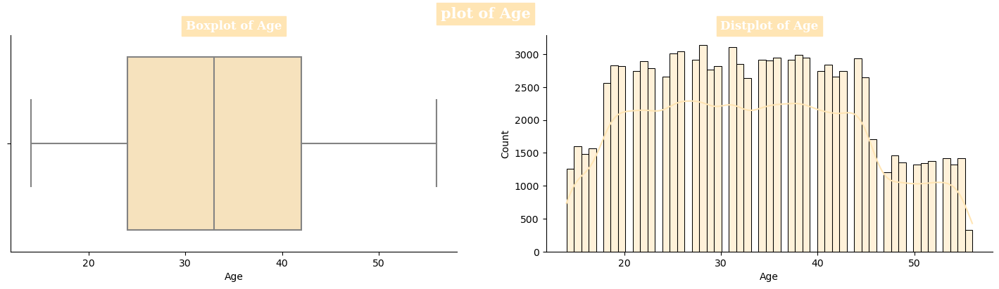

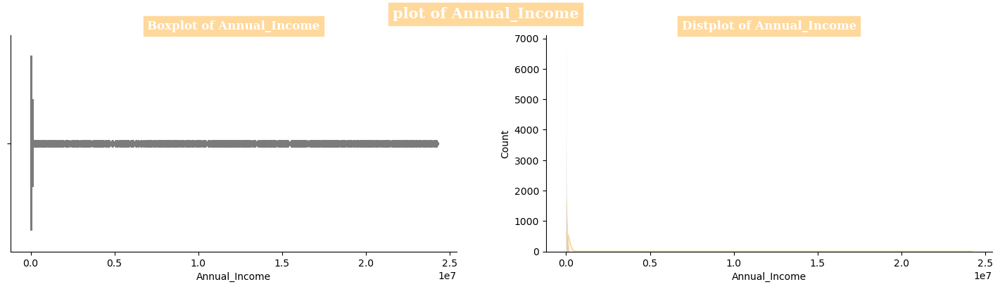

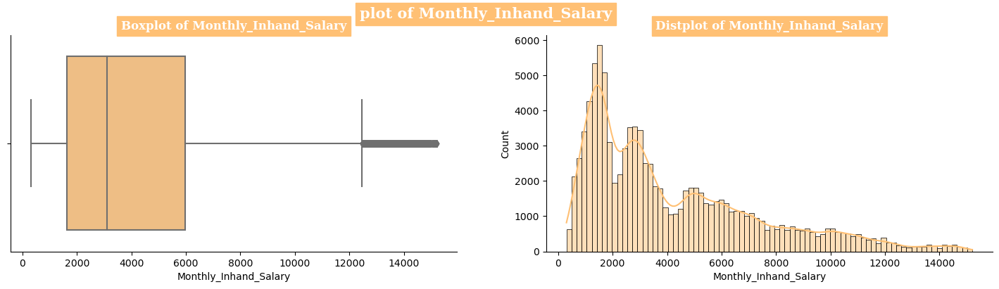

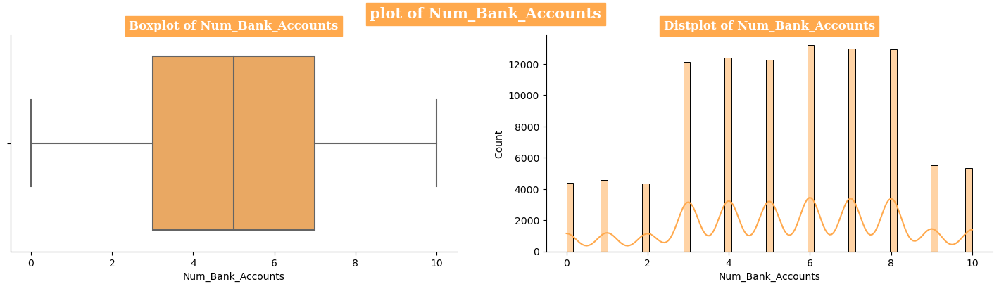

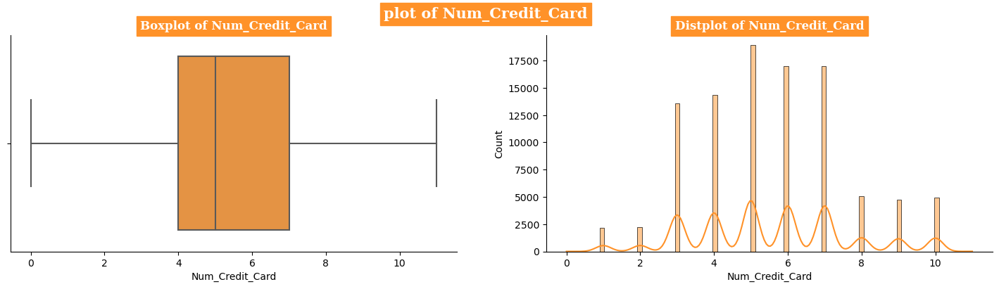

...

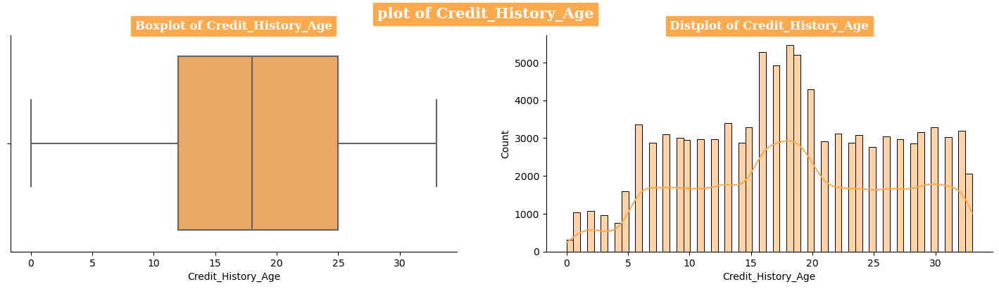

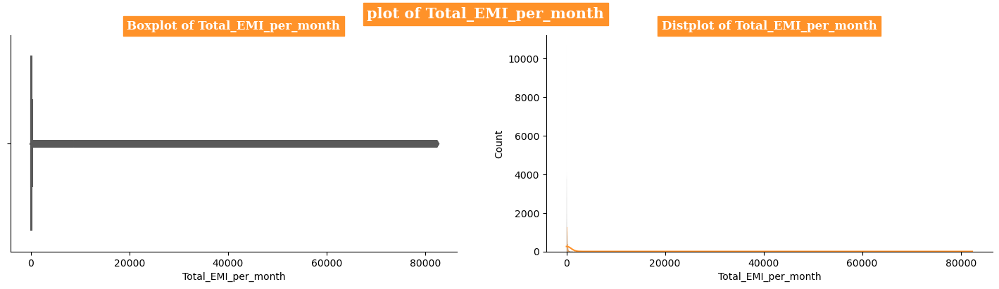

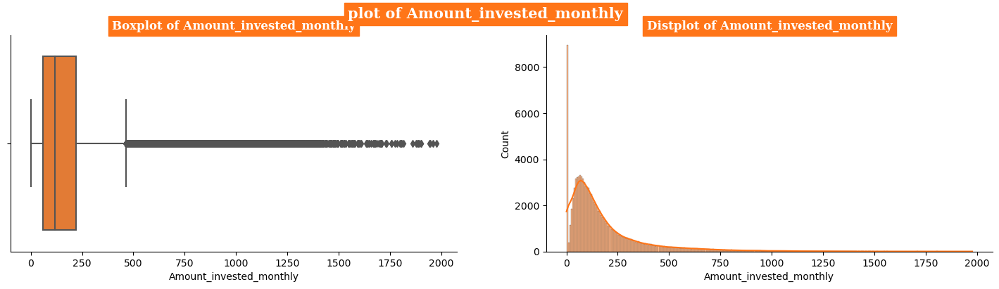

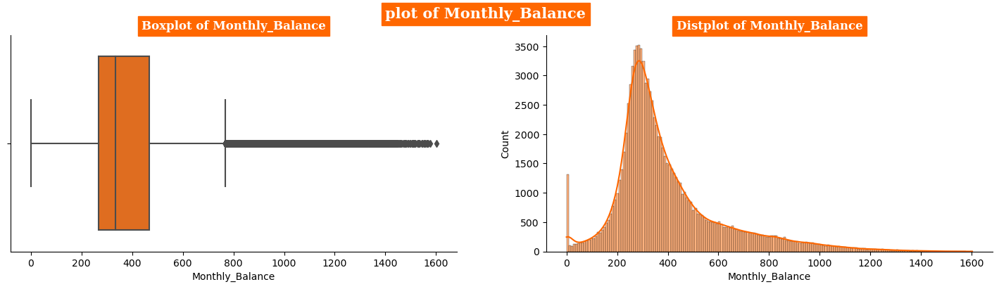

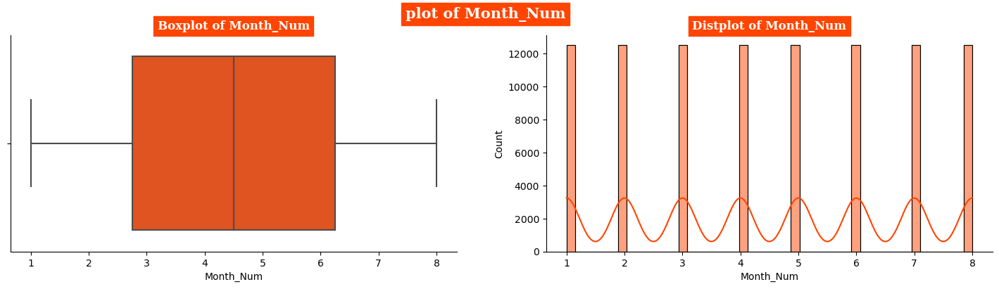

In [7]:
plt.style.use('default')
plt.style.use('seaborn-bright')

for _,col in enumerate(numerical_columns):
    plt.figure(figsize=(18,4))
    plt.suptitle(f'plot of {col}',fontsize=15,fontfamily='serif',fontweight='bold',backgroundcolor=cp[_],color='w')
    plt.subplot(121)
    sns.boxplot(x=df[col],color=cp[_])
    plt.title(f'Boxplot of {col}',fontsize=12,fontfamily='serif',fontweight='bold',backgroundcolor=cp[_],color='w')
    plt.subplot(122)
    sns.histplot(x=df[col], kde=True,color=cp[_])
    plt.title(f'Distplot of {col}',fontsize=12,fontfamily='serif',fontweight='bold',backgroundcolor=cp[_],color='w')
    sns.despine()
    plt.show()

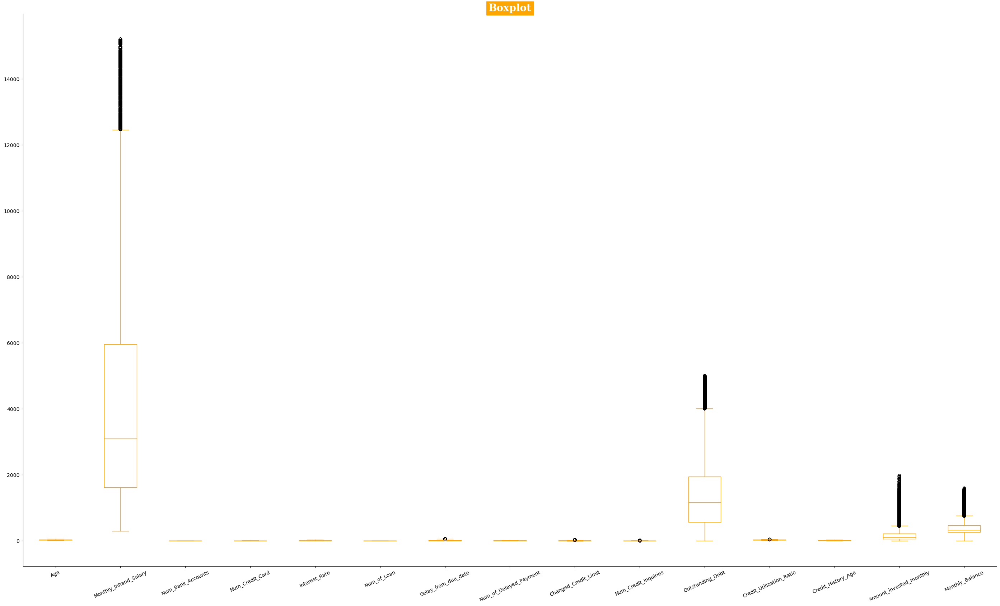

In [34]:
columns_to_plot = ['Age', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts', 'Num_Credit_Card',
                    'Interest_Rate', 'Num_of_Loan', 'Delay_from_due_date', 'Num_of_Delayed_Payment',
                    'Changed_Credit_Limit', 'Num_Credit_Inquiries', 'Outstanding_Debt',
                    'Credit_Utilization_Ratio', 'Credit_History_Age', 
                    'Amount_invested_monthly', 'Monthly_Balance']

plt.figure(figsize=(35, 20))
numerical_cols[columns_to_plot].boxplot(rot=25, color='orange')
plt.title(f'Boxplot',fontsize=20,fontfamily='serif',fontweight='bold',backgroundcolor='orange',color='w')
sns.despine()
plt.grid(False)
plt.show()

In [16]:
# Creating a dictionary for aggregation at Customer_ID level
agg_dict = {
    'ID': 'first',
     # Grouped by on Customer_ID so not included
    'Name': 'first',
    'Age': 'first',
    'SSN': 'first',
    'Occupation': 'first',
    'Annual_Income': 'first',
    'Monthly_Inhand_Salary': 'first',
    'Num_Bank_Accounts': 'first',
    'Num_Credit_Card': 'first',
    'Interest_Rate': 'first',
    'Num_of_Loan': 'first',
    'Type_of_Loan': 'first',
    'Delay_from_due_date': 'mean',
    'Num_of_Delayed_Payment': 'first',
    'Changed_Credit_Limit': 'mean',
    'Num_Credit_Inquiries': 'first',
    'Credit_Mix': 'first',
    'Outstanding_Debt': 'first',
    'Credit_Utilization_Ratio': 'mean',
    'Credit_History_Age': 'first',
    'Payment_of_Min_Amount': 'first',
    'Total_EMI_per_month': 'first',
    'Amount_invested_monthly': 'mean',
    # Payment_Behaviour not included
    # if needed introduce above and do mean
    #'Payment_History_Score':'mean',
    'Monthly_Balance': 'mean',
    
}
df_aggregated = df.groupby('Customer_ID').agg(agg_dict).reset_index()
df_aggregated

,Customer_ID,ID,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
0,CUS_0x1000,0x1628a,Alistair Barrf,17,913-74-1218,Lawyer,30625.940,2706.161667,6,5,27,2,"Credit-Builder Loan, and Home Equity Loan",62.0,25,1.880,11,Bad,1562.91,33.477546,10,Yes,42.941090,158.549735,335.375341
1,CUS_0x1009,0x66a2,Arunah,26,063-67-6938,Mechanic,52312.680,4250.390000,6,5,17,4,"Not Specified, Home Equity Loan, Credit-Builde...",8.0,18,9.730,2,Standard,202.68,29.839984,31,No,108.366467,146.679378,428.743155
2,CUS_0x100b,0x1ef6,Shirboni,18,238-62-0395,Media_Manager,113781.390,9549.782500,1,4,1,0,No loan taken,14.0,7,10.965,1,Good,1030.20,34.841449,15,No,0.000000,379.039895,781.229776
3,CUS_0x1011,0x17646,Schneyerh,44,793-05-8223,Doctor,58918.470,5208.872500,3,3,17,3,"Student Loan, Credit-Builder Loan, and Debt Co...",27.0,15,14.170,7,Standard,473.14,27.655897,15,Yes,123.434939,272.178300,332.642837
4,CUS_0x1013,0x243ea,Cameront,44,930-49-9615,Mechanic,98620.980,7962.415000,3,3,6,3,"Student Loan, Debt Consolidation Loan, and Per...",12.0,9,1.705,3,Good,1233.51,31.933940,17,No,228.018084,355.442408,472.781009
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12495,CUS_0xff3,0x344a,Somervilled,55,726-35-5322,Scientist,17032.785,1176.398750,0,6,2,3,"Personal Loan, Mortgage Loan, and Auto Loan",13.0,9,8.485,5,Good,1229.08,32.889398,17,No,33.299764,83.918549,271.671562
12496,CUS_0xff4,0x16aa,Poornimaf,37,655-05-7666,Entrepreneur,25546.260,2415.855000,8,7,14,5,"Not Specified, Student Loan, Student Loan, Cre...",16.0,10,8.205,5,Standard,758.44,32.598257,18,No,101.328637,152.775690,259.981173
12497,CUS_0xff6,0xfab6,Shieldsb,19,541-92-8371,Doctor,117639.920,9727.326667,5,6,1,2,"Home Equity Loan, and Auto Loan",1.0,4,11.900,2,Good,338.30,33.258053,24,No,126.638453,491.421152,583.907115
12498,CUS_0xffc,0x61e6,Brads,17,226-86-7294,Musician,60877.170,5218.097500,6,8,27,8,"Credit-Builder Loan, Payday Loan, Not Specifie...",46.0,16,9.320,13,Bad,1300.13,34.722108,13,Yes,272.809169,136.651352,339.951771


In [17]:
categorical_cols = df_aggregated.select_dtypes(include=['object', 'category'])

In [18]:
categorical_cols

,Customer_ID,ID,Name,SSN,Occupation,Type_of_Loan,Credit_Mix,Payment_of_Min_Amount
0,CUS_0x1000,0x1628a,Alistair Barrf,913-74-1218,Lawyer,"Credit-Builder Loan, and Home Equity Loan",Bad,Yes
1,CUS_0x1009,0x66a2,Arunah,063-67-6938,Mechanic,"Not Specified, Home Equity Loan, Credit-Builde...",Standard,No
2,CUS_0x100b,0x1ef6,Shirboni,238-62-0395,Media_Manager,No loan taken,Good,No
3,CUS_0x1011,0x17646,Schneyerh,793-05-8223,Doctor,"Student Loan, Credit-Builder Loan, and Debt Co...",Standard,Yes
4,CUS_0x1013,0x243ea,Cameront,930-49-9615,Mechanic,"Student Loan, Debt Consolidation Loan, and Per...",Good,No
...,...,...,...,...,...,...,...,...
12495,CUS_0xff3,0x344a,Somervilled,726-35-5322,Scientist,"Personal Loan, Mortgage Loan, and Auto Loan",Good,No
12496,CUS_0xff4,0x16aa,Poornimaf,655-05-7666,Entrepreneur,"Not Specified, Student Loan, Student Loan, Cre...",Standard,No
12497,CUS_0xff6,0xfab6,Shieldsb,541-92-8371,Doctor,"Home Equity Loan, and Auto Loan",Good,No
12498,CUS_0xffc,0x61e6,Brads,226-86-7294,Musician,"Credit-Builder Loan, Payday Loan, Not Specifie...",Bad,Yes


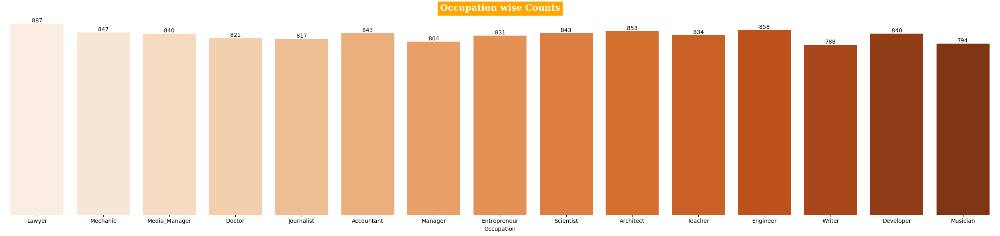

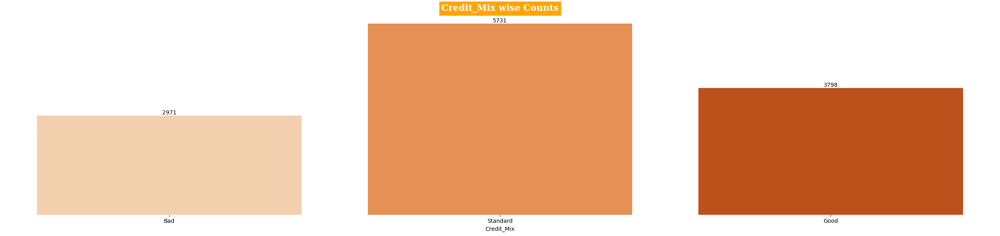

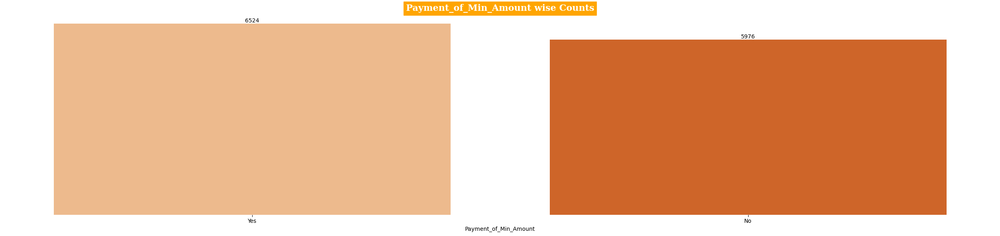

In [15]:
selected_cols = ['Occupation', 'Credit_Mix', 'Payment_of_Min_Amount']

for col in selected_cols:
    plt.figure(figsize=(25, 6))
    plt.style.use('default')
    plt.style.use('seaborn-bright')
    a = sns.countplot(data=categorical_cols, x=col, palette='Oranges')
    plt.title(f'{col} wise Counts', fontsize=16, fontfamily='serif', fontweight='bold', backgroundcolor='orange', color='w')
    a.bar_label(a.containers[0], label_type='edge')
    sns.despine(left=True, bottom=True)
    plt.yticks([])
    plt.ylabel('')
    plt.tight_layout()
    plt.show()

### 📉Skewness

In [22]:
# Skewness Coefficient
numerical_cols = df.select_dtypes(include=['float64', 'int64'])
print("Skewness Coefficient")
print("-" * 20)
df.skew(numeric_only = True)
#print(numerical_cols.skew().round(4))

Skewness Coefficient
--------------------


Age                          0.157009
Annual_Income               12.391367
Monthly_Inhand_Salary        1.128520
Num_Bank_Accounts           -0.189184
Num_Credit_Card              0.225830
Interest_Rate                0.496232
Num_of_Loan                  0.445609
Delay_from_due_date          0.985874
Num_of_Delayed_Payment      -0.223545
Changed_Credit_Limit         0.641177
Num_Credit_Inquiries         0.416113
Outstanding_Debt             1.207536
Credit_Utilization_Ratio     0.028617
Credit_History_Age          -0.048998
Total_EMI_per_month          7.102524
Amount_invested_monthly      2.548864
Monthly_Balance              1.498597
Month_Num                    0.000000
dtype: float64

##### 🕵🏼‍♂️Insights

**Highly Skewed Variables**:
   - **Annual_Income** (12.3914), **Total_EMI_per_month** (7.1025), and **Amount_invested_monthly** (2.5489) are highly positively skewed. This suggests that a small number of customers have significantly higher values in these categories compared to the rest, indicating the presence of outliers or a long tail in the distribution.
  
**Moderately Skewed Variables**:
   - **Outstanding_Debt** (1.2075), **Monthly_Balance** (1.4986), and **Monthly_Inhand_Salary** (1.1285) show moderate positive skewness, indicating that while the majority of values are lower, there are some customers with considerably higher values, leading to a rightward tail in the distribution.

**Nearly Symmetrical and Slightly Skewed Variables**:
   - Variables like **Age** (0.1570), **Num_Bank_Accounts** (-0.1892), and **Credit_History_Age** (-0.0490) exhibit low skewness, meaning their distributions are more symmetrical with values evenly spread around the mean. This suggests a more uniform distribution without significant outliers or tails.

In [21]:
numerical_cols.corr()

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Month_Num
Age,1.000000e+00,0.005590,0.090794,-1.909258e-01,-1.485908e-01,-2.178565e-01,-2.135980e-01,-1.750736e-01,-1.870159e-01,-0.156673,-2.566488e-01,-2.022942e-01,0.025482,2.342567e-01,0.001671,0.051313,0.116397,-1.490159e-16
Annual_Income,5.589605e-03,1.000000,0.031698,-9.883550e-03,-1.667479e-03,-7.455159e-03,-5.939649e-03,-1.161114e-02,-9.143734e-03,-0.000045,-9.308197e-03,-4.532592e-03,0.008606,-3.832667e-04,-0.001620,0.020078,0.018747,-3.515690e-03
Monthly_Inhand_Salary,9.079397e-02,0.031698,1.000000,-2.833183e-01,-2.169563e-01,-3.019058e-01,-2.544056e-01,-2.511619e-01,-2.898748e-01,-0.175135,-2.805907e-01,-2.690782e-01,0.176081,2.710583e-01,0.007949,0.568380,0.659723,-2.109457e-03
Num_Bank_Accounts,-1.909258e-01,-0.009884,-0.283318,1.000000e+00,4.423838e-01,5.844557e-01,4.725037e-01,5.640608e-01,6.120210e-01,0.330775,5.229506e-01,5.070425e-01,-0.071864,-4.847938e-01,-0.006337,-0.164038,-0.292672,-3.606326e-18
Num_Credit_Card,-1.485908e-01,-0.001667,-0.216956,4.423838e-01,1.000000e+00,4.979214e-01,4.178346e-01,4.830521e-01,4.300217e-01,0.252872,4.632187e-01,4.902662e-01,-0.055353,-4.165627e-01,-0.006683,-0.128014,-0.232505,-4.444433e-18
Interest_Rate,-2.178565e-01,-0.007455,-0.301906,5.844557e-01,4.979214e-01,1.000000e+00,5.591562e-01,5.929428e-01,5.809739e-01,0.366691,6.385437e-01,6.294144e-01,-0.075700,-5.754552e-01,-0.005090,-0.176749,-0.321081,6.403426e-18
Num_of_Loan,-2.135980e-01,-0.005940,-0.254406,4.725037e-01,4.178346e-01,5.591562e-01,1.000000e+00,5.045482e-01,4.818863e-01,0.370049,5.696246e-01,6.387126e-01,-0.100469,-6.051535e-01,-0.001266,-0.149001,-0.436500,1.550535e-16
Delay_from_due_date,-1.750736e-01,-0.011611,-0.251162,5.640608e-01,4.830521e-01,5.929428e-01,5.045482e-01,1.000000e+00,5.556486e-01,0.294922,5.477419e-01,5.754191e-01,-0.063895,-4.942710e-01,-0.003774,-0.149384,-0.276591,9.021475e-17
Num_of_Delayed_Payment,-1.870159e-01,-0.009144,-0.289875,6.120210e-01,4.300217e-01,5.809739e-01,4.818863e-01,5.556486e-01,1.000000e+00,0.331966,5.121594e-01,5.129790e-01,-0.075725,-4.898069e-01,-0.005457,-0.167218,-0.301803,-1.712349e-17
Changed_Credit_Limit,-1.566733e-01,-0.000045,-0.175135,3.307754e-01,2.528722e-01,3.666907e-01,3.700487e-01,2.949217e-01,3.319658e-01,1.000000,3.849967e-01,4.583831e-01,-0.047896,-4.244041e-01,-0.002380,-0.103062,-0.200331,-9.236838e-04


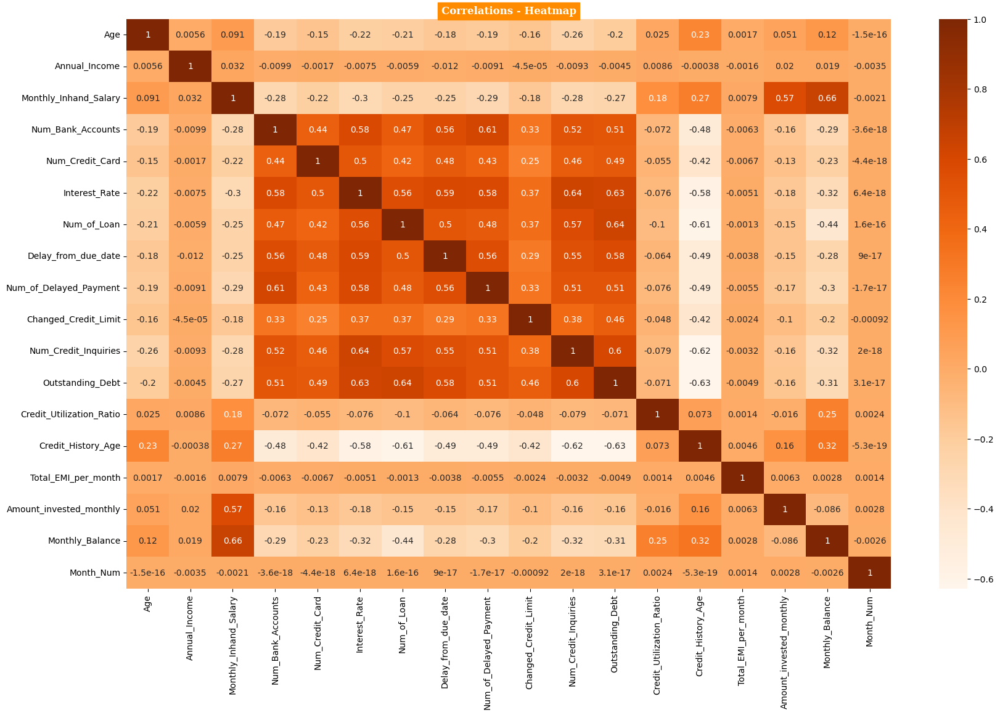

In [18]:
plt.figure(figsize=(20,12))
sns.heatmap(numerical_cols.corr(), annot=True, cmap='Oranges')
plt.title('Correlations - Heatmap',fontsize=12,fontfamily='serif',fontweight='bold',backgroundcolor='darkorange',color='w')
plt.show()

##### 🕵🏼‍♂️Insights

> **Strong Correlation with Monthly Inhand Salary and Investing**:
   - **Monthly Inhand Salary** shows a strong positive correlation with **Monthly Balance** (0.6597) and **Amount Invested Monthly** (0.5684), indicating that higher in-hand salary is associated with greater savings and investments.

> **Interest Rate and Credit Inquiries**:
   - **Interest Rate** is strongly correlated with **Num Credit Inquiries** (0.6385) and **Outstanding Debt** (0.6294), suggesting that customers with higher interest rates tend to have more credit inquiries and higher outstanding debt.

> **Num of Delayed Payments Impact**:
   - **Num of Delayed Payments** has a strong positive correlation with **Num of Bank Accounts** (0.6120) and **Delay from Due Date** (0.5556), indicating that customers with more bank accounts tend to delay payments more frequently.

> **Negative Impact on Credit History Age**:
   - **Credit History Age** has strong negative correlations with **Outstanding Debt** (-0.6285) and **Interest Rate** (-0.5755), implying that longer credit history is associated with lower debt and interest rates.

> **Moderate Correlation in Loan-related Metrics**:
   - **Num of Loans** is moderately correlated with **Interest Rate** (0.5592) and **Num Credit Inquiries** (0.5696), suggesting that customers with more loans tend to have higher interest rates and credit inquiries.

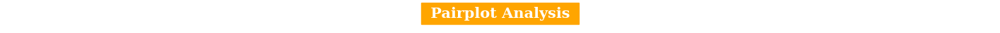

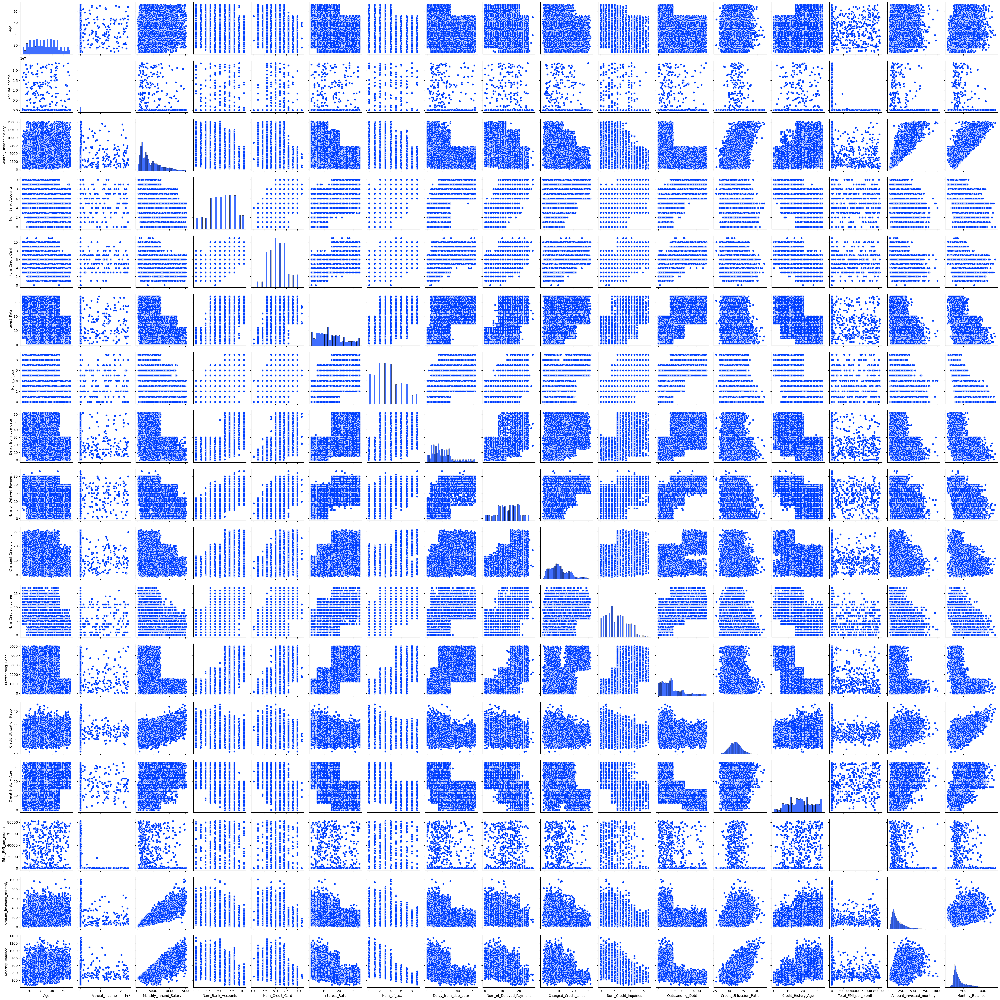

In [25]:
plt.figure(figsize=(18,0.05))
plt.axis('off')
plt.style.use('default')
plt.style.use('seaborn-bright')
plt.title(f' Pairplot Analysis ',fontfamily='serif',fontweight='bold',fontsize=15,backgroundcolor='orange',color='w')
sns.pairplot(data=df_aggregated,palette='Oranges')
plt.show()

## 🧮**Feature Engineering**

In [19]:
dff = df.copy()

In [20]:
dff.head(8)

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Month_Num
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3,4,11.27,4,Good,809.98,26.822620,22,No,49.574949,80.415295,High_spent_Small_value_payments,312.494089,1
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3,4,11.27,4,Good,809.98,31.944960,22,No,49.574949,118.280222,Low_spent_Large_value_payments,284.629163,2
2,0x1604,CUS_0xd40,March,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3,4,11.27,4,Good,809.98,28.609352,22,No,49.574949,81.699521,Low_spent_Medium_value_payments,331.209863,3
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3,4,6.27,4,Good,809.98,31.377862,22,No,49.574949,199.458074,Low_spent_Small_value_payments,223.451310,4
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3,4,11.27,4,Good,809.98,24.797347,22,No,49.574949,41.420153,High_spent_Medium_value_payments,341.489231,5
5,0x1607,CUS_0xd40,June,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3,4,9.27,4,Good,809.98,27.262259,22,No,49.574949,62.430172,High_spent_Medium_value_payments,340.479212,6
6,0x1608,CUS_0xd40,July,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3,4,11.27,4,Good,809.98,22.537593,22,No,49.574949,178.344067,Low_spent_Small_value_payments,244.565317,7
7,0x1609,CUS_0xd40,August,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3,4,11.27,4,Good,809.98,23.933795,22,No,49.574949,24.785217,High_spent_Medium_value_payments,358.124168,8


### Feature creation

In [21]:
dff['Debt_to_Income_Ratio'] = dff['Outstanding_Debt'] / dff['Annual_Income']
dff['Total_Debt'] = dff['Outstanding_Debt'] + dff['Total_EMI_per_month']

In [22]:
payment_behaviour_mapping = {
    'High_spent_Small_value_payments': 4,
    'High_spent_Medium_value_payments': 5,
    'High_spent_Large_value_payments': 6,
    'Low_spent_Small_value_payments': 1,
    'Low_spent_Medium_value_payments': 2,
    'Low_spent_Large_value_payments': 3
}

# Apply mapping
dff['Payment_Behaviour_Num'] = dff['Payment_Behaviour'].map(payment_behaviour_mapping)

##### 🕵🏼‍♂️Insights

* High_spent_Small_value_payments: Likely to indicate high spending habits with small payments, which might be risky if the behavior is consistent.
* High_spent_Medium_value_payments: Indicates high spending with medium payments, potentially a higher risk.
* High_spent_Large_value_payments: Shows high spending with large payments, which might indicate high financial risk.
* Low_spent_Small_value_payments: Shows low spending with small payments, likely less risky.
* Low_spent_Medium_value_payments: Low spending with medium payments, potentially moderate risk.
* Low_spent_Large_value_payments: Low spending with large payments, might be less risky but could indicate underutilization of credit.

In [23]:
dff['Credit_Mix'].unique()

array(['Good', 'Standard', 'Bad'], dtype=object)

In [24]:
dff['Credit_Mix_num'] = dff['Credit_Mix'].map({'Good':2 , 'Standard':1, 'Bad':0}) 


In [25]:
dff['Payment_of_Min_Amount'].unique()

array(['No', 'Yes'], dtype=object)

In [26]:
dff['Payment_of_Min_Amount'] = dff['Payment_of_Min_Amount'].map({'Yes':1, 'No':0})

In [27]:
dff['Payment_of_Min_Amount'].isna().sum() , dff['Payment_of_Min_Amount'].unique()

(0, array([0, 1], dtype=int64))

In [28]:
dff['30%_of_Monthly_Salary'] = dff['Monthly_Inhand_Salary']*0.3

dff['ability to pay loan with saving'] = np.where(dff['30%_of_Monthly_Salary']>dff['Monthly_Balance'],1,0)

In [29]:
dff = dff.drop(columns=['ID','Type_of_Loan','Credit_Mix','Payment_Behaviour'],axis=1)

In [31]:
dff["Payment_History_Score"] = ( -1 * dff["Delay_from_due_date"]
                                -1 * dff["Num_of_Delayed_Payment"]
                                +1 * dff["Payment_of_Min_Amount"])

In [32]:
dff.tail(8)

,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Month_Num,Debt_to_Income_Ratio,Total_Debt,Payment_Behaviour_Num,Credit_Mix_num,30%_of_Monthly_Salary,ability to pay loan with saving,Payment_History_Score
99992,CUS_0x942c,January,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,6,7,2,23,6,9.5,3,502.38,32.991333,31,0,35.104023,401.196481,189.641080,1,0.012677,537.484023,1,2,1007.82475,1,-29
99993,CUS_0x942c,February,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,6,7,2,23,6,11.5,3,502.38,29.135447,31,0,58638.000000,180.733095,400.104466,2,0.012677,59140.380000,2,2,1007.82475,1,-29
99994,CUS_0x942c,March,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,6,7,2,23,6,9.5,3,502.38,39.323569,31,0,35.104023,140.581403,410.256158,3,0.012677,537.484023,5,2,1007.82475,1,-29
99995,CUS_0x942c,April,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,6,7,2,23,6,11.5,3,502.38,34.663572,31,0,35.104023,60.971333,479.866228,4,0.012677,537.484023,6,2,1007.82475,1,-29
99996,CUS_0x942c,May,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,6,7,2,23,6,11.5,3,502.38,40.565631,31,0,35.104023,54.185950,496.651610,5,0.012677,537.484023,5,2,1007.82475,1,-29
99997,CUS_0x942c,June,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,6,7,2,23,6,11.5,3,502.38,41.255522,31,0,35.104023,24.028477,516.809083,6,0.012677,537.484023,6,2,1007.82475,1,-29
99998,CUS_0x942c,July,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,6,7,2,23,6,11.5,3,502.38,33.638208,31,0,35.104023,251.672582,319.164979,7,0.012677,537.484023,3,2,1007.82475,1,-29
99999,CUS_0x942c,August,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,6,7,2,23,6,11.5,3,502.38,34.192463,31,0,35.104023,167.163865,393.673696,8,0.012677,537.484023,3,2,1007.82475,1,-29


## ♾️**Hypothetical Credit_Score Computation**

### ⚖️ **Scaling**

In [33]:
scaling_features = dff.iloc[:, [3] + list(range(6, dff.shape[1]))].columns
scaling_features

Index(['Age', 'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
       'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan',
       'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Outstanding_Debt', 'Credit_Utilization_Ratio',
       'Credit_History_Age', 'Payment_of_Min_Amount', 'Total_EMI_per_month',
       'Amount_invested_monthly', 'Monthly_Balance', 'Month_Num',
       'Debt_to_Income_Ratio', 'Total_Debt', 'Payment_Behaviour_Num',
       'Credit_Mix_num', '30%_of_Monthly_Salary',
       'ability to pay loan with saving', 'Payment_History_Score'],
      dtype='object')

In [34]:
scaler = MinMaxScaler()
dff[scaling_features] = scaler.fit_transform(dff[scaling_features])

In [35]:
dff

,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Month_Num,Debt_to_Income_Ratio,Total_Debt,Payment_Behaviour_Num,Credit_Mix_num,30%_of_Monthly_Salary,ability to pay loan with saving,Payment_History_Score
0,CUS_0xd40,January,Aaron Maashoh,0.214286,821-00-0265,Scientist,0.000501,0.102087,0.3,0.363636,0.060606,0.444444,0.048387,0.142857,0.408652,0.235294,0.162020,0.227421,0.666667,0.0,0.000602,0.040669,0.195060,0.000000,0.062021,0.009949,0.6,1.0,0.102087,1.0,0.919540
1,CUS_0xd40,February,Aaron Maashoh,0.214286,821-00-0265,Scientist,0.000501,0.102087,0.3,0.363636,0.060606,0.444444,0.048387,0.142857,0.408652,0.235294,0.162020,0.398165,0.666667,0.0,0.000602,0.059818,0.177667,0.142857,0.062021,0.009949,0.4,1.0,0.102087,1.0,0.919540
2,CUS_0xd40,March,Aaron Maashoh,0.214286,821-00-0265,Scientist,0.000501,0.102087,0.3,0.363636,0.060606,0.444444,0.048387,0.142857,0.408652,0.235294,0.162020,0.286978,0.666667,0.0,0.000602,0.041318,0.206743,0.285714,0.062021,0.009949,0.2,1.0,0.102087,1.0,0.919540
3,CUS_0xd40,April,Aaron Maashoh,0.214286,821-00-0265,Scientist,0.000501,0.102087,0.3,0.363636,0.060606,0.444444,0.048387,0.142857,0.293603,0.235294,0.162020,0.379262,0.666667,0.0,0.000602,0.100873,0.139479,0.428571,0.062021,0.009949,0.0,1.0,0.102087,1.0,0.919540
4,CUS_0xd40,May,Aaron Maashoh,0.214286,821-00-0265,Scientist,0.000501,0.102087,0.3,0.363636,0.060606,0.444444,0.048387,0.142857,0.408652,0.235294,0.162020,0.159912,0.666667,0.0,0.000602,0.020948,0.213159,0.571429,0.062021,0.009949,0.8,1.0,0.102087,1.0,0.919540
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,CUS_0x942c,April,Nicks,0.261905,078-73-5990,Mechanic,0.001349,0.205072,0.4,0.545455,0.181818,0.222222,0.370968,0.214286,0.413944,0.176471,0.100473,0.488786,0.939394,0.0,0.000426,0.030835,0.299534,0.428571,0.018553,0.006218,1.0,1.0,0.205072,1.0,0.666667
99996,CUS_0x942c,May,Nicks,0.261905,078-73-5990,Mechanic,0.001349,0.205072,0.4,0.545455,0.181818,0.222222,0.370968,0.214286,0.413944,0.176471,0.100473,0.685521,0.939394,0.0,0.000426,0.027404,0.310012,0.571429,0.018553,0.006218,0.8,1.0,0.205072,1.0,0.666667
99997,CUS_0x942c,June,Nicks,0.261905,078-73-5990,Mechanic,0.001349,0.205072,0.4,0.545455,0.181818,0.222222,0.370968,0.214286,0.413944,0.176471,0.100473,0.708517,0.939394,0.0,0.000426,0.012152,0.322594,0.714286,0.018553,0.006218,1.0,1.0,0.205072,1.0,0.666667
99998,CUS_0x942c,July,Nicks,0.261905,078-73-5990,Mechanic,0.001349,0.205072,0.4,0.545455,0.181818,0.222222,0.370968,0.214286,0.413944,0.176471,0.100473,0.454607,0.939394,0.0,0.000426,0.127279,0.199224,0.857143,0.018553,0.006218,0.4,1.0,0.205072,1.0,0.666667


In [36]:
dff.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 31 columns):
 #   Column                           Non-Null Count   Dtype  
---  ------                           --------------   -----  
 0   Customer_ID                      100000 non-null  object 
 1   Month                            100000 non-null  object 
 2   Name                             100000 non-null  object 
 3   Age                              100000 non-null  float64
 4   SSN                              100000 non-null  object 
 5   Occupation                       100000 non-null  object 
 6   Annual_Income                    100000 non-null  float64
 7   Monthly_Inhand_Salary            100000 non-null  float64
 8   Num_Bank_Accounts                100000 non-null  float64
 9   Num_Credit_Card                  100000 non-null  float64
 10  Interest_Rate                    100000 non-null  float64
 11  Num_of_Loan                      100000 non-null  float64
 12  Del

In [37]:
# Define new feature weights including RFM
weights = {
    'Payment_Behaviour_Num': 0.10,
    'Credit_Utilization_Ratio': 0.10,
    'Outstanding_Debt': 0.05,
    'ability to pay loan with saving':0.10,
    'Total_EMI_per_month': 0.10,
    'Num_Credit_Inquiries': 0.05,
    'Credit_History_Age': 0.10,
    'Monthly_Balance': 0.10,
    'Annual_Income': 0.05,
    'Num_Bank_Accounts': 0.05,
    'Credit_Mix_num': 0.05,
    'Payment_History_Score': 0.15
}

### <font color=orange>**Reasons for feature selection and its weightage -- Credit Score Computation**</font>

> **Outstanding_Debt:**
  - Represents the total debt owed. Significant outstanding debt can signal financial strain, impacting the ability to manage new credit.

> **Total_EMI_per_month:**
  - Indicates the total monthly payments towards loans. Helps assess the customer’s existing debt burden and financial obligations.

> **Num_Credit_Inquiries:**
  - Shows how frequently the customer has applied for credit. Frequent inquiries can suggest financial distress or a high demand for credit.

> **Credit_History_Age:**
  - Reflects the length of time the customer has maintained credit accounts. A longer credit history generally suggests more reliable credit behavior.

> **Monthly_Balance:**
  - Tracks the customer’s balance on a monthly basis. A consistently positive balance indicates stronger financial health and stability.

> **Annual_Income:**
  - Provides insight into the customer’s financial capacity. Higher income typically suggests a greater ability to manage and repay debt.

> **Num_Bank_Accounts:**
  - Reflects the number of bank accounts held. Multiple accounts can indicate effective financial management, although an excess might signal potential financial issues.

> **Credit_Mix_Num:**
  - Indicates the diversity of credit types held. A varied credit mix can positively influence creditworthiness, demonstrating the ability to manage different credit types.
  
> **Payment_Behaviour_Num:**
  - Captures payment habits, essential for assessing creditworthiness. Reflects factors like payment frequency and amounts, which are crucial for credit evaluation.

> **Credit_Utilization_Ratio:**
  - Measures the proportion of credit used relative to total credit available. A high ratio may indicate potential financial risk due to extensive credit usage.

> **Payment_history_score:**
  - Payments history plays a major role in determining the credit approval and hence heavy weightage.

In [38]:
dff['Credit_Score'] = dff.apply(lambda x: sum(x[feature] * weight for feature, weight in weights.items()), axis=1)

In [39]:
dff['Credit_Score'] = dff['Credit_Score'] * (850 - 300) + 300

In [40]:
dff[(dff['Credit_Score']<300) | (dff['Credit_Score']>850)]

,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Month_Num,Debt_to_Income_Ratio,Total_Debt,Payment_Behaviour_Num,Credit_Mix_num,30%_of_Monthly_Salary,ability to pay loan with saving,Payment_History_Score,Credit_Score


In [41]:
cs_df = dff[['Customer_ID','Name','SSN','Month','Credit_Score']]

### 🪢Aggregated data - Consolidated

In [42]:
cdf = cs_df.groupby(['Customer_ID','Name','SSN'])['Credit_Score'].mean().to_frame().round().astype(int).reset_index()
cdf.sample(10)

,Customer_ID,Name,SSN,Credit_Score
6091,CUS_0x6b24,Neil Maidmentb,215-10-3907,506
2376,CUS_0x3595,Alexf,578-52-7354,566
2175,CUS_0x3237,Tomg,066-87-9187,502
7837,CUS_0x85ba,Mette Fraendef,366-96-2058,570
1046,CUS_0x2168,Robinh,113-94-0469,574
3525,CUS_0x4671,Alwyn Scottm,667-35-5970,528
6932,CUS_0x7812,Davev,992-47-8736,542
6569,CUS_0x7251,Kelleheri,516-69-1184,621
11530,CUS_0xbbcf,rad Dorfmank,355-33-6296,532
9455,CUS_0x9d7d,Silvia Aloisid,574-82-7157,568


In [43]:
bins = [300, 500, 600, 750, 800, 850]
bin_labels = ['very Bad','Poor', 'Fair', 'Good', 'Excellent']

# Apply binning
dff['Monthly_Credit_Score_category'] = pd.cut(dff['Credit_Score'], bins=bins, labels=bin_labels, right=True)

In [44]:
dff.head(8)

,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Month_Num,Debt_to_Income_Ratio,Total_Debt,Payment_Behaviour_Num,Credit_Mix_num,30%_of_Monthly_Salary,ability to pay loan with saving,Payment_History_Score,Credit_Score,Monthly_Credit_Score_category
0,CUS_0xd40,January,Aaron Maashoh,0.214286,821-00-0265,Scientist,0.000501,0.102087,0.3,0.363636,0.060606,0.444444,0.048387,0.142857,0.408652,0.235294,0.16202,0.227421,0.666667,0.0,0.000602,0.040669,0.195060,0.000000,0.062021,0.009949,0.6,1.0,0.102087,1.0,0.91954,570.488194,Poor
1,CUS_0xd40,February,Aaron Maashoh,0.214286,821-00-0265,Scientist,0.000501,0.102087,0.3,0.363636,0.060606,0.444444,0.048387,0.142857,0.408652,0.235294,0.16202,0.398165,0.666667,0.0,0.000602,0.059818,0.177667,0.142857,0.062021,0.009949,0.4,1.0,0.102087,1.0,0.91954,567.922515,Poor
2,CUS_0xd40,March,Aaron Maashoh,0.214286,821-00-0265,Scientist,0.000501,0.102087,0.3,0.363636,0.060606,0.444444,0.048387,0.142857,0.408652,0.235294,0.16202,0.286978,0.666667,0.0,0.000602,0.041318,0.206743,0.285714,0.062021,0.009949,0.2,1.0,0.102087,1.0,0.91954,552.406405,Poor
3,CUS_0xd40,April,Aaron Maashoh,0.214286,821-00-0265,Scientist,0.000501,0.102087,0.3,0.363636,0.060606,0.444444,0.048387,0.142857,0.293603,0.235294,0.16202,0.379262,0.666667,0.0,0.000602,0.100873,0.139479,0.428571,0.062021,0.009949,0.0,1.0,0.102087,1.0,0.91954,542.782525,Poor
4,CUS_0xd40,May,Aaron Maashoh,0.214286,821-00-0265,Scientist,0.000501,0.102087,0.3,0.363636,0.060606,0.444444,0.048387,0.142857,0.408652,0.235294,0.16202,0.159912,0.666667,0.0,0.000602,0.020948,0.213159,0.571429,0.062021,0.009949,0.8,1.0,0.102087,1.0,0.91954,578.770633,Poor
5,CUS_0xd40,June,Aaron Maashoh,0.214286,821-00-0265,Scientist,0.000501,0.102087,0.3,0.363636,0.060606,0.444444,0.048387,0.142857,0.362632,0.235294,0.16202,0.242075,0.666667,0.0,0.000602,0.031573,0.212528,0.714286,0.062021,0.009949,0.8,1.0,0.102087,1.0,0.91954,583.254962,Poor
6,CUS_0xd40,July,Aaron Maashoh,0.214286,821-00-0265,Scientist,0.000501,0.102087,0.3,0.363636,0.060606,0.444444,0.048387,0.142857,0.408652,0.235294,0.16202,0.084586,0.666667,0.0,0.000602,0.090195,0.152659,0.857143,0.062021,0.009949,0.0,1.0,0.102087,1.0,0.91954,527.300235,Poor
7,CUS_0xd40,August,Aaron Maashoh,0.214286,821-00-0265,Scientist,0.000501,0.102087,0.3,0.363636,0.060606,0.444444,0.048387,0.142857,0.408652,0.235294,0.16202,0.131126,0.666667,0.0,0.000602,0.012535,0.223543,1.000000,0.062021,0.009949,0.8,1.0,0.102087,1.0,0.91954,577.758551,Poor


In [45]:
bins = [300, 500, 600, 750, 800, 850]
bin_labels = ['very Bad','Poor', 'Fair', 'Good', 'Excellent']

# Apply binning
cdf['overall_Credit_Score_category'] = pd.cut(dff['Credit_Score'], bins=bins, labels=bin_labels, right=True)

In [46]:
cdf.sample(10)

,Customer_ID,Name,SSN,Credit_Score,overall_Credit_Score_category
2129,CUS_0x3172,Paulv,570-35-6060,555,Poor
10567,CUS_0xadee,Lisa Juccaw,748-31-3173,553,Poor
3077,CUS_0x4044,Vlastelicaz,628-08-4129,540,very Bad
8113,CUS_0x8984,Jessicaw,669-48-7668,544,Poor
2898,CUS_0x3df0,Lopezt,095-52-8522,559,Poor
4050,CUS_0x4dd5,Herberty,530-61-6560,490,very Bad
6825,CUS_0x765,Taylorl,282-28-8981,543,Poor
2508,CUS_0x37bd,Barrn,849-09-5390,522,very Bad
1733,CUS_0x2ba8,Alanu,158-66-2244,581,Poor
6271,CUS_0x6df9,Whited,859-34-6416,521,Poor


In [47]:
cdf.groupby('overall_Credit_Score_category')['Customer_ID'].nunique().to_frame()

,Customer_ID
overall_Credit_Score_category,
very Bad,2147
Poor,9192
Fair,1161
Good,0
Excellent,0


In [48]:
cdf.overall_Credit_Score_category.value_counts()

Poor         9192
very Bad     2147
Fair         1161
Good            0
Excellent       0
Name: overall_Credit_Score_category, dtype: int64

In [49]:
cdf.shape

(12500, 5)

In [50]:
cdf

,Customer_ID,Name,SSN,Credit_Score,overall_Credit_Score_category
0,CUS_0x1000,Alistair Barrf,913-74-1218,482,Poor
1,CUS_0x1009,Arunah,063-67-6938,571,Poor
2,CUS_0x100b,Shirboni,238-62-0395,565,Poor
3,CUS_0x1011,Schneyerh,793-05-8223,507,Poor
4,CUS_0x1013,Cameront,930-49-9615,573,Poor
...,...,...,...,...,...
12495,CUS_0xff3,Somervilled,726-35-5322,541,Poor
12496,CUS_0xff4,Poornimaf,655-05-7666,543,Poor
12497,CUS_0xff6,Shieldsb,541-92-8371,590,Poor
12498,CUS_0xffc,Brads,226-86-7294,518,Poor


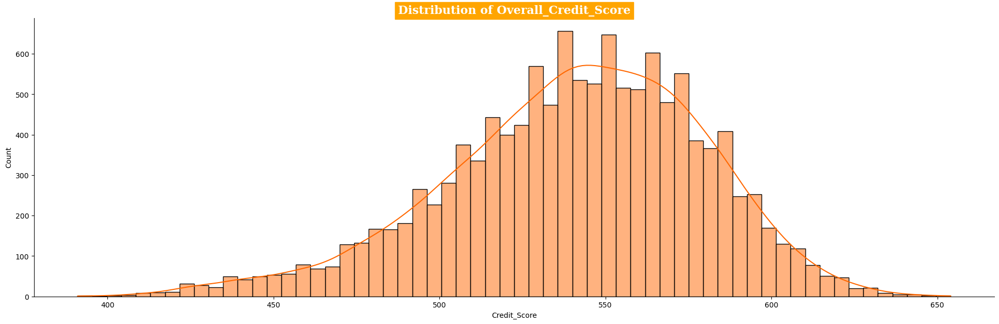

In [53]:
plt.figure(figsize=(24,7))
plt.title('Distribution of Overall_Credit_Score',fontsize=16,fontfamily='serif',fontweight='bold',backgroundcolor='orange',color='w')
sns.histplot(cdf['Credit_Score'],color=cp[6],kde=True)
sns.despine()
plt.show()

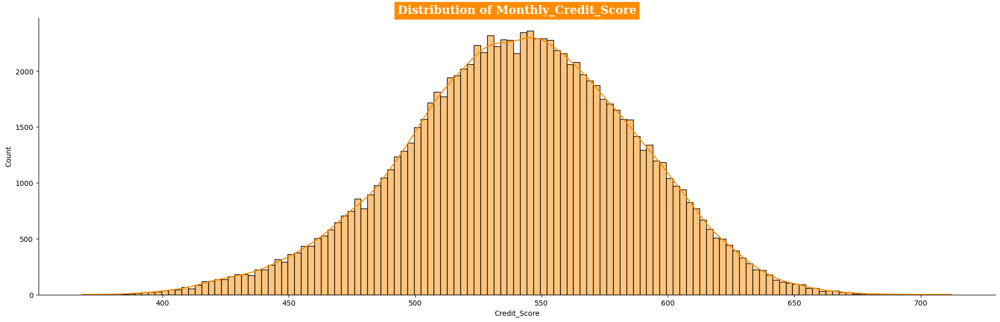

In [54]:
plt.figure(figsize=(24,7))
plt.title('Distribution of Monthly_Credit_Score',fontsize=16,fontfamily='serif',fontweight='bold',backgroundcolor='darkorange',color='w')
sns.histplot(dff['Credit_Score'],color=cp[8],kde=True)
sns.despine()
plt.show()

In [200]:
#cdf.to_csv('credit_scored_data.csv',index=False)

In [55]:
Fair_customers = cdf[cdf['overall_Credit_Score_category'] == 'Fair']
Fair_customers.describe().T

,count,mean,std,min,25%,50%,75%,max
Credit_Score,1161.0,539.585702,39.489149,411.0,516.0,543.0,568.0,645.0


### <font color='orange'>**RFM Integration**</font>

In [56]:
dff['Recency'] = dff.groupby('Customer_ID')['Month_Num'].transform(lambda x: (x.max() - x))
dff['Frequency'] = dff.groupby('Customer_ID')['Num_of_Loan'].transform('max')
dff['Monetary'] = dff.groupby('Customer_ID')['Monthly_Balance'].transform('sum')

rfm_features = ['Recency', 'Frequency', 'Monetary']
dff[rfm_features] = scaler.fit_transform(dff[rfm_features])

In [57]:
dff

,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Month_Num,Debt_to_Income_Ratio,Total_Debt,Payment_Behaviour_Num,Credit_Mix_num,30%_of_Monthly_Salary,ability to pay loan with saving,Payment_History_Score,Credit_Score,Monthly_Credit_Score_category,Recency,Frequency,Monetary
0,CUS_0xd40,January,Aaron Maashoh,0.214286,821-00-0265,Scientist,0.000501,0.102087,0.3,0.363636,0.060606,0.444444,0.048387,0.142857,0.408652,0.235294,0.162020,0.227421,0.666667,0.0,0.000602,0.040669,0.195060,0.000000,0.062021,0.009949,0.6,1.0,0.102087,1.0,0.919540,570.488194,Poor,1.000000,0.444444,0.178767
1,CUS_0xd40,February,Aaron Maashoh,0.214286,821-00-0265,Scientist,0.000501,0.102087,0.3,0.363636,0.060606,0.444444,0.048387,0.142857,0.408652,0.235294,0.162020,0.398165,0.666667,0.0,0.000602,0.059818,0.177667,0.142857,0.062021,0.009949,0.4,1.0,0.102087,1.0,0.919540,567.922515,Poor,0.857143,0.444444,0.178767
2,CUS_0xd40,March,Aaron Maashoh,0.214286,821-00-0265,Scientist,0.000501,0.102087,0.3,0.363636,0.060606,0.444444,0.048387,0.142857,0.408652,0.235294,0.162020,0.286978,0.666667,0.0,0.000602,0.041318,0.206743,0.285714,0.062021,0.009949,0.2,1.0,0.102087,1.0,0.919540,552.406405,Poor,0.714286,0.444444,0.178767
3,CUS_0xd40,April,Aaron Maashoh,0.214286,821-00-0265,Scientist,0.000501,0.102087,0.3,0.363636,0.060606,0.444444,0.048387,0.142857,0.293603,0.235294,0.162020,0.379262,0.666667,0.0,0.000602,0.100873,0.139479,0.428571,0.062021,0.009949,0.0,1.0,0.102087,1.0,0.919540,542.782525,Poor,0.571429,0.444444,0.178767
4,CUS_0xd40,May,Aaron Maashoh,0.214286,821-00-0265,Scientist,0.000501,0.102087,0.3,0.363636,0.060606,0.444444,0.048387,0.142857,0.408652,0.235294,0.162020,0.159912,0.666667,0.0,0.000602,0.020948,0.213159,0.571429,0.062021,0.009949,0.8,1.0,0.102087,1.0,0.919540,578.770633,Poor,0.428571,0.444444,0.178767
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,CUS_0x942c,April,Nicks,0.261905,078-73-5990,Mechanic,0.001349,0.205072,0.4,0.545455,0.181818,0.222222,0.370968,0.214286,0.413944,0.176471,0.100473,0.488786,0.939394,0.0,0.000426,0.030835,0.299534,0.428571,0.018553,0.006218,1.0,1.0,0.205072,1.0,0.666667,606.200769,Fair,0.571429,0.222222,0.254401
99996,CUS_0x942c,May,Nicks,0.261905,078-73-5990,Mechanic,0.001349,0.205072,0.4,0.545455,0.181818,0.222222,0.370968,0.214286,0.413944,0.176471,0.100473,0.685521,0.939394,0.0,0.000426,0.027404,0.310012,0.571429,0.018553,0.006218,0.8,1.0,0.205072,1.0,0.666667,606.597473,Fair,0.428571,0.222222,0.254401
99997,CUS_0x942c,June,Nicks,0.261905,078-73-5990,Mechanic,0.001349,0.205072,0.4,0.545455,0.181818,0.222222,0.370968,0.214286,0.413944,0.176471,0.100473,0.708517,0.939394,0.0,0.000426,0.012152,0.322594,0.714286,0.018553,0.006218,1.0,1.0,0.205072,1.0,0.666667,619.554305,Fair,0.285714,0.222222,0.254401
99998,CUS_0x942c,July,Nicks,0.261905,078-73-5990,Mechanic,0.001349,0.205072,0.4,0.545455,0.181818,0.222222,0.370968,0.214286,0.413944,0.176471,0.100473,0.454607,0.939394,0.0,0.000426,0.127279,0.199224,0.857143,0.018553,0.006218,0.4,1.0,0.205072,1.0,0.666667,565.803866,Poor,0.142857,0.222222,0.254401


In [58]:
dff['Credit_Score_after_RFM'] = dff['Credit_Score'] + (dff['Recency'] * 0.1 + dff['Frequency'] * 0.1 + dff['Monetary'] * 0.1)

In [59]:
dff.tail(8)

,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Month_Num,Debt_to_Income_Ratio,Total_Debt,Payment_Behaviour_Num,Credit_Mix_num,30%_of_Monthly_Salary,ability to pay loan with saving,Payment_History_Score,Credit_Score,Monthly_Credit_Score_category,Recency,Frequency,Monetary,Credit_Score_after_RFM
99992,CUS_0x942c,January,Nicks,0.261905,078-73-5990,Mechanic,0.001349,0.205072,0.4,0.545455,0.181818,0.222222,0.370968,0.214286,0.367925,0.176471,0.100473,0.433044,0.939394,0.0,0.000426,0.202898,0.118375,0.000000,0.018553,0.006218,0.0,1.0,0.205072,1.0,0.666667,538.171215,Poor,1.000000,0.222222,0.254401,538.318878
99993,CUS_0x942c,February,Nicks,0.261905,078-73-5990,Mechanic,0.001349,0.205072,0.4,0.545455,0.181818,0.222222,0.370968,0.214286,0.413944,0.176471,0.100473,0.304515,0.939394,0.0,0.712223,0.091403,0.249747,0.142857,0.018553,0.685098,0.2,1.0,0.205072,1.0,0.666667,588.476349,Poor,0.857143,0.222222,0.254401,588.609725
99994,CUS_0x942c,March,Nicks,0.261905,078-73-5990,Mechanic,0.001349,0.205072,0.4,0.545455,0.181818,0.222222,0.370968,0.214286,0.367925,0.176471,0.100473,0.644119,0.939394,0.0,0.000426,0.071097,0.256084,0.285714,0.018553,0.006218,0.8,1.0,0.205072,1.0,0.666667,601.354299,Fair,0.714286,0.222222,0.254401,601.473390
99995,CUS_0x942c,April,Nicks,0.261905,078-73-5990,Mechanic,0.001349,0.205072,0.4,0.545455,0.181818,0.222222,0.370968,0.214286,0.413944,0.176471,0.100473,0.488786,0.939394,0.0,0.000426,0.030835,0.299534,0.428571,0.018553,0.006218,1.0,1.0,0.205072,1.0,0.666667,606.200769,Fair,0.571429,0.222222,0.254401,606.305574
99996,CUS_0x942c,May,Nicks,0.261905,078-73-5990,Mechanic,0.001349,0.205072,0.4,0.545455,0.181818,0.222222,0.370968,0.214286,0.413944,0.176471,0.100473,0.685521,0.939394,0.0,0.000426,0.027404,0.310012,0.571429,0.018553,0.006218,0.8,1.0,0.205072,1.0,0.666667,606.597473,Fair,0.428571,0.222222,0.254401,606.687993
99997,CUS_0x942c,June,Nicks,0.261905,078-73-5990,Mechanic,0.001349,0.205072,0.4,0.545455,0.181818,0.222222,0.370968,0.214286,0.413944,0.176471,0.100473,0.708517,0.939394,0.0,0.000426,0.012152,0.322594,0.714286,0.018553,0.006218,1.0,1.0,0.205072,1.0,0.666667,619.554305,Fair,0.285714,0.222222,0.254401,619.630538
99998,CUS_0x942c,July,Nicks,0.261905,078-73-5990,Mechanic,0.001349,0.205072,0.4,0.545455,0.181818,0.222222,0.370968,0.214286,0.413944,0.176471,0.100473,0.454607,0.939394,0.0,0.000426,0.127279,0.199224,0.857143,0.018553,0.006218,0.4,1.0,0.205072,1.0,0.666667,565.803866,Poor,0.142857,0.222222,0.254401,565.865814
99999,CUS_0x942c,August,Nicks,0.261905,078-73-5990,Mechanic,0.001349,0.205072,0.4,0.545455,0.181818,0.222222,0.370968,0.214286,0.413944,0.176471,0.100473,0.473082,0.939394,0.0,0.000426,0.084540,0.245733,1.000000,0.018553,0.006218,0.4,1.0,0.205072,1.0,0.666667,569.377974,Poor,0.000000,0.222222,0.254401,569.425637


In [60]:
bins = [300, 500, 600, 750, 800, 850]
bin_labels = ['very Bad','Poor', 'Fair', 'Good', 'Excellent']

# Apply binning
dff['RFM_Credit_Score_category'] = pd.cut(dff['Credit_Score_after_RFM'], bins=bins, labels=bin_labels, right=True)

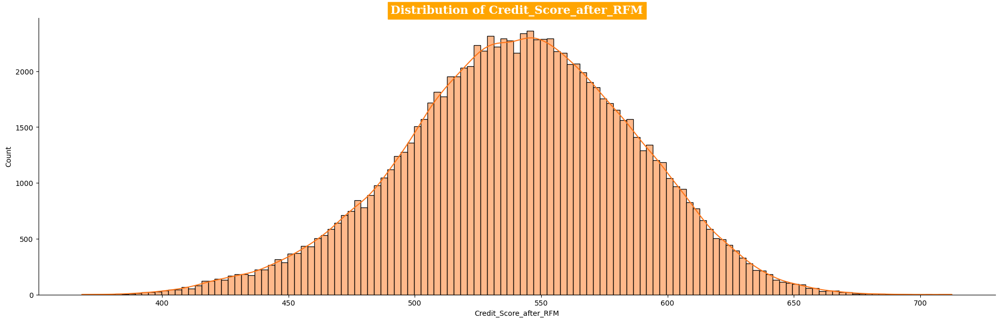

In [61]:
plt.figure(figsize=(24,7))
plt.title('Distribution of Credit_Score_after_RFM',fontsize=16,fontfamily='serif',fontweight='bold',backgroundcolor='orange',color='w')
sns.histplot(dff['Credit_Score_after_RFM'],color=cp[5],kde=True)
sns.despine()
plt.show()

In [62]:
dff.head(8)

,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Month_Num,Debt_to_Income_Ratio,Total_Debt,Payment_Behaviour_Num,Credit_Mix_num,30%_of_Monthly_Salary,ability to pay loan with saving,Payment_History_Score,Credit_Score,Monthly_Credit_Score_category,Recency,Frequency,Monetary,Credit_Score_after_RFM,RFM_Credit_Score_category
0,CUS_0xd40,January,Aaron Maashoh,0.214286,821-00-0265,Scientist,0.000501,0.102087,0.3,0.363636,0.060606,0.444444,0.048387,0.142857,0.408652,0.235294,0.16202,0.227421,0.666667,0.0,0.000602,0.040669,0.195060,0.000000,0.062021,0.009949,0.6,1.0,0.102087,1.0,0.91954,570.488194,Poor,1.000000,0.444444,0.178767,570.650515,Poor
1,CUS_0xd40,February,Aaron Maashoh,0.214286,821-00-0265,Scientist,0.000501,0.102087,0.3,0.363636,0.060606,0.444444,0.048387,0.142857,0.408652,0.235294,0.16202,0.398165,0.666667,0.0,0.000602,0.059818,0.177667,0.142857,0.062021,0.009949,0.4,1.0,0.102087,1.0,0.91954,567.922515,Poor,0.857143,0.444444,0.178767,568.070550,Poor
2,CUS_0xd40,March,Aaron Maashoh,0.214286,821-00-0265,Scientist,0.000501,0.102087,0.3,0.363636,0.060606,0.444444,0.048387,0.142857,0.408652,0.235294,0.16202,0.286978,0.666667,0.0,0.000602,0.041318,0.206743,0.285714,0.062021,0.009949,0.2,1.0,0.102087,1.0,0.91954,552.406405,Poor,0.714286,0.444444,0.178767,552.540155,Poor
3,CUS_0xd40,April,Aaron Maashoh,0.214286,821-00-0265,Scientist,0.000501,0.102087,0.3,0.363636,0.060606,0.444444,0.048387,0.142857,0.293603,0.235294,0.16202,0.379262,0.666667,0.0,0.000602,0.100873,0.139479,0.428571,0.062021,0.009949,0.0,1.0,0.102087,1.0,0.91954,542.782525,Poor,0.571429,0.444444,0.178767,542.901989,Poor
4,CUS_0xd40,May,Aaron Maashoh,0.214286,821-00-0265,Scientist,0.000501,0.102087,0.3,0.363636,0.060606,0.444444,0.048387,0.142857,0.408652,0.235294,0.16202,0.159912,0.666667,0.0,0.000602,0.020948,0.213159,0.571429,0.062021,0.009949,0.8,1.0,0.102087,1.0,0.91954,578.770633,Poor,0.428571,0.444444,0.178767,578.875811,Poor
5,CUS_0xd40,June,Aaron Maashoh,0.214286,821-00-0265,Scientist,0.000501,0.102087,0.3,0.363636,0.060606,0.444444,0.048387,0.142857,0.362632,0.235294,0.16202,0.242075,0.666667,0.0,0.000602,0.031573,0.212528,0.714286,0.062021,0.009949,0.8,1.0,0.102087,1.0,0.91954,583.254962,Poor,0.285714,0.444444,0.178767,583.345855,Poor
6,CUS_0xd40,July,Aaron Maashoh,0.214286,821-00-0265,Scientist,0.000501,0.102087,0.3,0.363636,0.060606,0.444444,0.048387,0.142857,0.408652,0.235294,0.16202,0.084586,0.666667,0.0,0.000602,0.090195,0.152659,0.857143,0.062021,0.009949,0.0,1.0,0.102087,1.0,0.91954,527.300235,Poor,0.142857,0.444444,0.178767,527.376841,Poor
7,CUS_0xd40,August,Aaron Maashoh,0.214286,821-00-0265,Scientist,0.000501,0.102087,0.3,0.363636,0.060606,0.444444,0.048387,0.142857,0.408652,0.235294,0.16202,0.131126,0.666667,0.0,0.000602,0.012535,0.223543,1.000000,0.062021,0.009949,0.8,1.0,0.102087,1.0,0.91954,577.758551,Poor,0.000000,0.444444,0.178767,577.820873,Poor


In [63]:
dff.groupby('RFM_Credit_Score_category')['Customer_ID'].nunique().to_frame()

,Customer_ID
RFM_Credit_Score_category,
very Bad,4920
Poor,11917
Fair,3571
Good,0
Excellent,0


In [64]:
cdff = dff.groupby('Customer_ID')['Credit_Score_after_RFM'].mean().to_frame().reset_index()
cdff

,Customer_ID,Credit_Score_after_RFM
0,CUS_0x1000,482.128252
1,CUS_0x1009,571.445711
2,CUS_0x100b,564.627757
3,CUS_0x1011,507.128548
4,CUS_0x1013,572.948491
...,...,...
12495,CUS_0xff3,541.035743
12496,CUS_0xff4,543.165731
12497,CUS_0xff6,589.904199
12498,CUS_0xffc,518.068314


In [65]:
bins = [300, 500, 650, 750, 800, 850]
bin_labels = ['very Bad','Poor', 'Fair', 'Good', 'Excellent']

# Apply binning
cdff['cumulative_RFM_Credit_Score_category'] = pd.cut(cdff['Credit_Score_after_RFM'], bins=bins, labels=bin_labels, right=True)

In [66]:
cdff.sample(6)

,Customer_ID,Credit_Score_after_RFM,cumulative_RFM_Credit_Score_category
8911,CUS_0x9550,555.711098,Poor
11747,CUS_0xbf01,519.751361,Poor
12296,CUS_0xce1,520.430840,Poor
1323,CUS_0x2590,484.849258,very Bad
7539,CUS_0x8110,525.116305,Poor
2441,CUS_0x36b4,533.448583,Poor


In [67]:
cdff.groupby('cumulative_RFM_Credit_Score_category')['Customer_ID'].nunique().to_frame()

,Customer_ID
cumulative_RFM_Credit_Score_category,
very Bad,1820
Poor,10679
Fair,1
Good,0
Excellent,0


### 🕵🏼‍♂️ Insights

* After applying RFM analysis, there are noticeable differences in creditworthiness across different customer segments. The categorization of customers has shifted, indicating that the influence of RFM analysis has led to changes in the classification of creditworthiness, even with the bins being set consistently across the board.

> This insight highlights the dynamic nature of creditworthiness assessment when influenced by RFM, emphasizing how customer segmentation can change based on different metrics.

### <font color=#FF8C00>**3 Months - Transaction Period Analysis**</font>

> Analyze how credit scores and aggregated features change over the last 3 to 6 months to understand the temporal dynamics of creditworthiness.  
Lets consider `Last 3 months`.

In [68]:
dff.tail(8)

,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Month_Num,Debt_to_Income_Ratio,Total_Debt,Payment_Behaviour_Num,Credit_Mix_num,30%_of_Monthly_Salary,ability to pay loan with saving,Payment_History_Score,Credit_Score,Monthly_Credit_Score_category,Recency,Frequency,Monetary,Credit_Score_after_RFM,RFM_Credit_Score_category
99992,CUS_0x942c,January,Nicks,0.261905,078-73-5990,Mechanic,0.001349,0.205072,0.4,0.545455,0.181818,0.222222,0.370968,0.214286,0.367925,0.176471,0.100473,0.433044,0.939394,0.0,0.000426,0.202898,0.118375,0.000000,0.018553,0.006218,0.0,1.0,0.205072,1.0,0.666667,538.171215,Poor,1.000000,0.222222,0.254401,538.318878,Poor
99993,CUS_0x942c,February,Nicks,0.261905,078-73-5990,Mechanic,0.001349,0.205072,0.4,0.545455,0.181818,0.222222,0.370968,0.214286,0.413944,0.176471,0.100473,0.304515,0.939394,0.0,0.712223,0.091403,0.249747,0.142857,0.018553,0.685098,0.2,1.0,0.205072,1.0,0.666667,588.476349,Poor,0.857143,0.222222,0.254401,588.609725,Poor
99994,CUS_0x942c,March,Nicks,0.261905,078-73-5990,Mechanic,0.001349,0.205072,0.4,0.545455,0.181818,0.222222,0.370968,0.214286,0.367925,0.176471,0.100473,0.644119,0.939394,0.0,0.000426,0.071097,0.256084,0.285714,0.018553,0.006218,0.8,1.0,0.205072,1.0,0.666667,601.354299,Fair,0.714286,0.222222,0.254401,601.473390,Fair
99995,CUS_0x942c,April,Nicks,0.261905,078-73-5990,Mechanic,0.001349,0.205072,0.4,0.545455,0.181818,0.222222,0.370968,0.214286,0.413944,0.176471,0.100473,0.488786,0.939394,0.0,0.000426,0.030835,0.299534,0.428571,0.018553,0.006218,1.0,1.0,0.205072,1.0,0.666667,606.200769,Fair,0.571429,0.222222,0.254401,606.305574,Fair
99996,CUS_0x942c,May,Nicks,0.261905,078-73-5990,Mechanic,0.001349,0.205072,0.4,0.545455,0.181818,0.222222,0.370968,0.214286,0.413944,0.176471,0.100473,0.685521,0.939394,0.0,0.000426,0.027404,0.310012,0.571429,0.018553,0.006218,0.8,1.0,0.205072,1.0,0.666667,606.597473,Fair,0.428571,0.222222,0.254401,606.687993,Fair
99997,CUS_0x942c,June,Nicks,0.261905,078-73-5990,Mechanic,0.001349,0.205072,0.4,0.545455,0.181818,0.222222,0.370968,0.214286,0.413944,0.176471,0.100473,0.708517,0.939394,0.0,0.000426,0.012152,0.322594,0.714286,0.018553,0.006218,1.0,1.0,0.205072,1.0,0.666667,619.554305,Fair,0.285714,0.222222,0.254401,619.630538,Fair
99998,CUS_0x942c,July,Nicks,0.261905,078-73-5990,Mechanic,0.001349,0.205072,0.4,0.545455,0.181818,0.222222,0.370968,0.214286,0.413944,0.176471,0.100473,0.454607,0.939394,0.0,0.000426,0.127279,0.199224,0.857143,0.018553,0.006218,0.4,1.0,0.205072,1.0,0.666667,565.803866,Poor,0.142857,0.222222,0.254401,565.865814,Poor
99999,CUS_0x942c,August,Nicks,0.261905,078-73-5990,Mechanic,0.001349,0.205072,0.4,0.545455,0.181818,0.222222,0.370968,0.214286,0.413944,0.176471,0.100473,0.473082,0.939394,0.0,0.000426,0.084540,0.245733,1.000000,0.018553,0.006218,0.4,1.0,0.205072,1.0,0.666667,569.377974,Poor,0.000000,0.222222,0.254401,569.425637,Poor


In [69]:
months = ['June', 'July', 'August']

filtered_dff = dff[dff['Month'].isin(months)]

In [70]:
filtered_dff.shape

(37500, 38)

In [71]:
filtered_dff.tail(6)

,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Month_Num,Debt_to_Income_Ratio,Total_Debt,Payment_Behaviour_Num,Credit_Mix_num,30%_of_Monthly_Salary,ability to pay loan with saving,Payment_History_Score,Credit_Score,Monthly_Credit_Score_category,Recency,Frequency,Monetary,Credit_Score_after_RFM,RFM_Credit_Score_category
99989,CUS_0x8600,June,Sarah McBridec,0.333333,031-35-0942,Architect,0.000537,0.109138,1.0,0.727273,0.848485,0.555556,0.532258,0.892857,0.524620,0.529412,0.714603,0.445333,0.181818,1.0,0.000740,0.037610,0.192042,0.714286,0.261337,0.042073,0.0,0.0,0.109138,1.0,0.344828,490.269803,very Bad,0.285714,0.555556,0.171086,490.371039,very Bad
99990,CUS_0x8600,July,Sarah McBridec,0.333333,031-35-0942,Architect,0.000537,0.109138,1.0,0.727273,0.848485,0.555556,0.532258,0.892857,0.570640,0.529412,0.714603,0.170784,0.181818,1.0,0.000740,0.087631,0.142787,0.857143,0.261337,0.042073,0.4,0.0,0.109138,1.0,0.344828,494.460602,very Bad,0.142857,0.555556,0.171086,494.547552,very Bad
99991,CUS_0x8600,August,Sarah McBridec,0.333333,031-35-0942,Architect,0.000537,0.109138,1.0,0.727273,0.848485,0.555556,0.532258,0.892857,0.570640,0.529412,0.714603,0.571359,0.181818,1.0,0.000740,0.017530,0.210583,1.000000,0.261337,0.042073,1.0,0.0,0.109138,1.0,0.344828,553.221027,Poor,0.000000,0.555556,0.171086,553.293691,Poor
99997,CUS_0x942c,June,Nicks,0.261905,078-73-5990,Mechanic,0.001349,0.205072,0.4,0.545455,0.181818,0.222222,0.370968,0.214286,0.413944,0.176471,0.100473,0.708517,0.939394,0.0,0.000426,0.012152,0.322594,0.714286,0.018553,0.006218,1.0,1.0,0.205072,1.0,0.666667,619.554305,Fair,0.285714,0.222222,0.254401,619.630538,Fair
99998,CUS_0x942c,July,Nicks,0.261905,078-73-5990,Mechanic,0.001349,0.205072,0.4,0.545455,0.181818,0.222222,0.370968,0.214286,0.413944,0.176471,0.100473,0.454607,0.939394,0.0,0.000426,0.127279,0.199224,0.857143,0.018553,0.006218,0.4,1.0,0.205072,1.0,0.666667,565.803866,Poor,0.142857,0.222222,0.254401,565.865814,Poor
99999,CUS_0x942c,August,Nicks,0.261905,078-73-5990,Mechanic,0.001349,0.205072,0.4,0.545455,0.181818,0.222222,0.370968,0.214286,0.413944,0.176471,0.100473,0.473082,0.939394,0.0,0.000426,0.084540,0.245733,1.000000,0.018553,0.006218,0.4,1.0,0.205072,1.0,0.666667,569.377974,Poor,0.000000,0.222222,0.254401,569.425637,Poor


In [72]:
fdf = filtered_dff[['Customer_ID','Name','Credit_Score','Monthly_Credit_Score_category','Credit_Score_after_RFM','RFM_Credit_Score_category']]
fdf

,Customer_ID,Name,Credit_Score,Monthly_Credit_Score_category,Credit_Score_after_RFM,RFM_Credit_Score_category
5,CUS_0xd40,Aaron Maashoh,583.254962,Poor,583.345855,Poor
6,CUS_0xd40,Aaron Maashoh,527.300235,Poor,527.376841,Poor
7,CUS_0xd40,Aaron Maashoh,577.758551,Poor,577.820873,Poor
13,CUS_0x21b1,Rick Rothackerj,611.531934,Fair,611.601268,Fair
14,CUS_0x21b1,Rick Rothackerj,595.837460,Poor,595.892508,Poor
...,...,...,...,...,...,...
99990,CUS_0x8600,Sarah McBridec,494.460602,very Bad,494.547552,very Bad
99991,CUS_0x8600,Sarah McBridec,553.221027,Poor,553.293691,Poor
99997,CUS_0x942c,Nicks,619.554305,Fair,619.630538,Fair
99998,CUS_0x942c,Nicks,565.803866,Poor,565.865814,Poor


In [73]:
fdf['diff'] = fdf['Credit_Score_after_RFM'] - fdf['Credit_Score']

In [74]:
fdf

,Customer_ID,Name,Credit_Score,Monthly_Credit_Score_category,Credit_Score_after_RFM,RFM_Credit_Score_category,diff
5,CUS_0xd40,Aaron Maashoh,583.254962,Poor,583.345855,Poor,0.090893
6,CUS_0xd40,Aaron Maashoh,527.300235,Poor,527.376841,Poor,0.076607
7,CUS_0xd40,Aaron Maashoh,577.758551,Poor,577.820873,Poor,0.062321
13,CUS_0x21b1,Rick Rothackerj,611.531934,Fair,611.601268,Fair,0.069334
14,CUS_0x21b1,Rick Rothackerj,595.837460,Poor,595.892508,Poor,0.055048
...,...,...,...,...,...,...,...
99990,CUS_0x8600,Sarah McBridec,494.460602,very Bad,494.547552,very Bad,0.086950
99991,CUS_0x8600,Sarah McBridec,553.221027,Poor,553.293691,Poor,0.072664
99997,CUS_0x942c,Nicks,619.554305,Fair,619.630538,Fair,0.076234
99998,CUS_0x942c,Nicks,565.803866,Poor,565.865814,Poor,0.061948


In [75]:
fdf[(fdf['diff']>1) | (fdf['diff']<0)]

,Customer_ID,Name,Credit_Score,Monthly_Credit_Score_category,Credit_Score_after_RFM,RFM_Credit_Score_category,diff


✍🏼***Observation:***

* There is a very minute difference when it comes to monthwise credit score with RFM.

In [76]:
fdf['Last_3_months_Credit_Score_consolidated'] = fdf.groupby(['Customer_ID', 'Name'])['Credit_Score'].transform('mean')

In [77]:
fdf

,Customer_ID,Name,Credit_Score,Monthly_Credit_Score_category,Credit_Score_after_RFM,RFM_Credit_Score_category,diff,Last_3_months_Credit_Score_consolidated
5,CUS_0xd40,Aaron Maashoh,583.254962,Poor,583.345855,Poor,0.090893,562.771249
6,CUS_0xd40,Aaron Maashoh,527.300235,Poor,527.376841,Poor,0.076607,562.771249
7,CUS_0xd40,Aaron Maashoh,577.758551,Poor,577.820873,Poor,0.062321,562.771249
13,CUS_0x21b1,Rick Rothackerj,611.531934,Fair,611.601268,Fair,0.069334,586.258493
14,CUS_0x21b1,Rick Rothackerj,595.837460,Poor,595.892508,Poor,0.055048,586.258493
...,...,...,...,...,...,...,...,...
99990,CUS_0x8600,Sarah McBridec,494.460602,very Bad,494.547552,very Bad,0.086950,512.650477
99991,CUS_0x8600,Sarah McBridec,553.221027,Poor,553.293691,Poor,0.072664,512.650477
99997,CUS_0x942c,Nicks,619.554305,Fair,619.630538,Fair,0.076234,584.912048
99998,CUS_0x942c,Nicks,565.803866,Poor,565.865814,Poor,0.061948,584.912048


In [78]:
bins = [300, 500, 650, 750, 800, 850]
bin_labels = ['very Bad','Poor', 'Fair', 'Good', 'Excellent']
fdf['last_3_months_Credit_Score_category'] = pd.cut(fdf['Last_3_months_Credit_Score_consolidated'], bins=bins, labels=bin_labels, right=True)

In [79]:
l3m = fdf[['Customer_ID','Name','Last_3_months_Credit_Score_consolidated','last_3_months_Credit_Score_category']]

In [80]:
l3m_unique = l3m.drop_duplicates(subset=['Customer_ID', 'Name'], keep='first')

In [81]:
l3m_unique.sample(10)

,Customer_ID,Name,Last_3_months_Credit_Score_consolidated,last_3_months_Credit_Score_category
77045,CUS_0x7f86,Sophieu,561.325970,Poor
54837,CUS_0x7768,Dhanya Skariachanc,579.117808,Poor
30789,CUS_0x90f0,Longstrethw,515.271800,Poor
91013,CUS_0x74e5,Wickhamw,567.677802,Poor
44045,CUS_0x130b,Nicolacib,564.763657,Poor
69181,CUS_0x6eb2,Wanfeng Zhouz,554.395167,Poor
85141,CUS_0x4dfe,Praveenf,607.713946,Poor
32221,CUS_0x7067,Peter Laurias,613.513904,Poor
25357,CUS_0x56a9,Kambasc,514.212060,Poor
33469,CUS_0xbfed,Dan Levineq,550.090211,Poor


In [82]:
l3m_unique.groupby('last_3_months_Credit_Score_category')['Customer_ID'].nunique().to_frame()

,Customer_ID
last_3_months_Credit_Score_category,
very Bad,1985
Poor,10501
Fair,14
Good,0
Excellent,0


Enter your Credit Score -  598


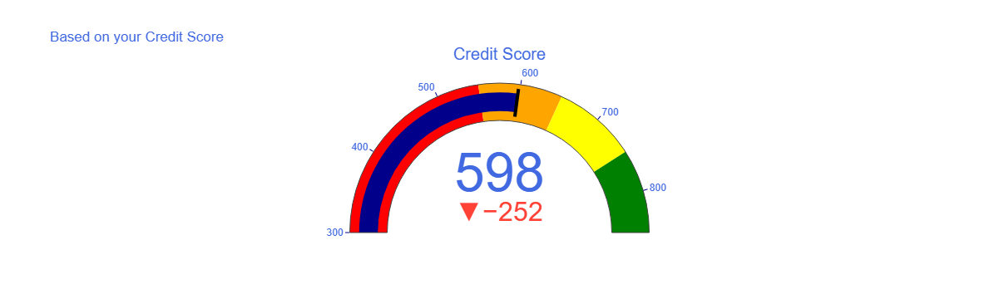

In [269]:
import plotly.graph_objects as go

credit_score_input = int(input('Enter your Credit Score - '))

# Define the gauge plot
fig = go.Figure(go.Indicator(
    mode="gauge+number+delta",
    value=credit_score_input,
    title={'text': "Credit Score"},
    delta={'reference': 850, 'increasing': {'color': "green"}},
    gauge={
        'axis': {'range': [300, 850], 'tickwidth': 1, 'tickcolor': "darkblue"},
        'bar': {'color': "darkblue"},
        'bgcolor': "white",
        'steps': [
            {'range': [300, 550], 'color': 'red'},
            {'range': [550, 650], 'color': 'orange'},
            {'range': [650, 750], 'color': 'yellow'},
            {'range': [750, 850], 'color': 'green'}],
        'threshold': {
            'line': {'color': "black", 'width': 4},
            'thickness': 0.75,
            'value': credit_score_input}}))

fig.update_layout(
    title="Based on your Credit Score",
    font={'color': "royalblue", 'family': "Arial"},
)

fig.show()

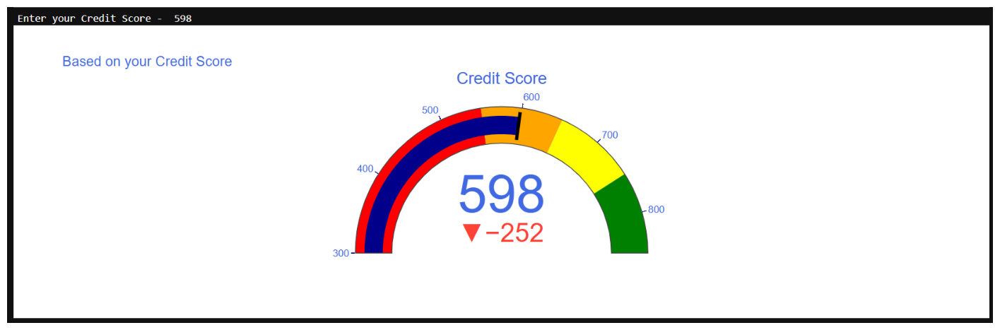

In [2]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

plt.figure(figsize=(18,6))
# Path to your image file
img_path = 'above screenshot.png'
# Load and display the image
img = mpimg.imread(img_path)
plt.imshow(img)
plt.axis('off')  # Hide axis
plt.show()

---------------

### 🧐✍🏼<font color='orange'>**Insights on Analysis**</font> 

>>>> (update the numbers) from above

>  **Overall Credit Score Categories**:
  - **Very Bad**: 7412
  - **Poor**: 5076
  - **Fair**: 12
  - **Good**: 0
  - **Excellent**: 0

    *Observation*: Most customers fall into the "Very Bad" or "Poor" categories, with very few in the "Fair" category and none in the "Good" or "Excellent" categories.
    
    
    
    
    

>  **Cumulative RFM Credit Score Categories**:
  - **Very Bad**: 7788
  - **Poor**: 4712
  - **Fair**: 0
  - **Good**: 0
  - **Excellent**: 0

    *Observation*: After integrating RFM factors, the number of customers in the "Very Bad" category has increased, while those in the "Poor" category have decreased. No customers fall into the "Fair," "Good," or "Excellent" categories.  
    
    
    
    

>  **Last 3 Months Credit Score Categories**:
  - **Very Bad**: 7761
  - **Poor**: 4739
  - **Fair**: 0
  - **Good**: 0
  - **Excellent**: 0

    *Observation*: Similar to the cumulative RFM scores, the "Very Bad" and "Poor" categories dominate, with no customers in the higher categories.
  
  
-------------- 
    
####  <font color='FD9B63'>***💭Possible Reasons***</font>

> **High Proportion in "Very Bad" and "Poor" Categories**: 
  - The dominance of the "Very Bad" and "Poor" categories across all models suggests a high level of credit risk among customers. 
  - **Possible Factors**: High levels of outstanding debt, poor payment behavior, high credit utilization, or recent negative changes in financial behavior could contribute to these scores.

> **No Customers in Higher Categories Post-RFM Integration**:
  - The complete absence of "Fair," "Good," and "Excellent" categories after integrating RFM features indicates that RFM factors might be emphasizing risks or penalizing certain credit behaviors heavily.
  - **Possible Factors**: The integration of RFM features may have introduced stricter criteria or revealed high-risk patterns not captured previously.

> **Stable Distribution in Last 3 Months**:
  - The consistency in the distribution for the last 3 months mirrors the cumulative RFM scores, suggesting that recent credit behavior aligns with the longer-term integrated RFM analysis.
  - **Possible Factors**: Recent credit behaviors might be reflective of ongoing financial issues or consistent poor credit management.
  
  
-------------  
    
    
####  <font color='FD9B63'>***📜Summary***</font>

* Overall, both the cumulative and recent transaction-based analyses indicate a high proportion of customers in the "Very Bad" and "Poor" categories, suggesting significant credit risk. 
* The integration of RFM features has intensified this trend, possibly due to the introduction of more granular risk factors. 
* This highlights the need for targeted financial interventions or improved credit management practices among customers.

--------


## <font color='FF8343'>***✨Recommendations & Suggestions✨***</font>


> **Refine Credit Scoring Models**:
   - **Action**: Integrate RFM and advanced metrics into credit scoring models to enhance accuracy and identify high-risk customers.
   - **Benefit**: Improved prediction of creditworthiness and risk management.

> **Enhance Customer Engagement**:
   - **Action**: Implement proactive communication strategies, such as alerts and reminders, to encourage timely payments.
   - **Benefit**: Reduced missed payments and improved credit behavior.

> **Develop Financial Education Programs**:
   - **Action**: Offer targeted financial literacy resources to help customers manage debt and improve credit scores.
   - **Benefit**: Better customer financial health and responsible credit usage.

> **Adjust Credit Limits Strategically**:
   - **Action**: Regularly review and adjust credit limits based on current credit utilization and payment behavior.
   - **Benefit**: Better alignment of credit limits with customers' repayment ability and risk mitigation.

> **Leverage Predictive Analytics**:
   - **Action**: Use predictive analytics to identify potential credit risks early and take preemptive actions.
   - **Benefit**: Timely risk management and reduced likelihood of defaults.

> **Incentivize Positive Credit Behaviors**:
   - **Action**: Reward customers for improved credit management and responsible behavior.
   - **Benefit**: Encourages better credit practices and enhances overall credit profiles.
   


<h2 align='center'>Analysed by : <font color='#fa7f22'><b> KASI </b></font></h2>


----------

